# Applicazione del modello ARPA all'intero 2025 — mappe previste, residui e statistiche d'errore

**Obiettivo.** Prendere i **quattro modelli validati** in `modello_s5p_era5_arpa.ipynb`
(target = mappe assimilate ARPA di `NO₂`, `O₃`, `PM10`, `PM2.5`; predittori = un proxy
Sentinel-5P con lag e media mobile + cinque variabili ERA5 al giorno *t*), **applicarli a
tutti i giorni del 2025** e produrre:

1. le **mappe giornaliere previste** dei quattro inquinanti, **alla risoluzione originale di
   Sentinel-5P** (un valore per pixel S5P nativo, nessun ricampionamento);
2. le **mappe del valore ARPA** osservato e le **mappe dei residui**, sulla stessa griglia e
   con la stessa scala di colore;
3. **statistiche d'errore** globali, e **sintesi temporali** (giorno, mese, stagione) e
   **spaziali** (per punto) dei residui.

---

## Convenzione dei residui (esplicita e usata ovunque in questo notebook)

$$\boxed{\;r(t,s) \;=\; \mathrm{ARPA}(t,s) \;-\; \widehat{\mathrm{ARPA}}(t,s)\;}$$

con $t$ = giorno, $s$ = punto (pixel Sentinel-5P nativo).

| segno | significato |
|---|---|
| $r > 0$ | il modello **sottostima**: la mappa ARPA è più alta della previsione |
| $r < 0$ | il modello **sovrastima**: la previsione è più alta della mappa ARPA |

Di conseguenza il **bias** riportato qui è $\overline{r} = \overline{\mathrm{ARPA}} - \overline{\widehat{\mathrm{ARPA}}}$.

> ⚠️ **Attenzione al confronto con `modello_s5p_era5_arpa.ipynb`.** Quel notebook usa la
> convenzione **opposta** (`residuo = previsto − osservato`). `R²`, `RMSE` e `MAE` sono invarianti
> rispetto al segno, ma il **bias cambia di segno**. Il § 5.4 verifica numericamente che
> `Bias(qui) = −Bias(modello_sintesi.csv)` per ciascun inquinante: è il controllo che le due
> convenzioni siano allineate e non che ci sia un errore di calcolo.

---

## Due previsioni, non una

Applicare "il modello" a tutto il 2025 richiede di dire **quale stima dei coefficienti** si usa.
Il notebook ne produce **due**, entrambe salvate, perché rispondono a domande diverse:

| colonna | come è ottenuta | copertura | a cosa serve |
|---|---|---|---|
| `previsione` | **modello finale**, stimato su **tutti** i casi completi del 2025 | tutto il 2025 | è il **prodotto cartografico** richiesto: mappe complete e coerenti su tutto l'anno |
| `previsione_oos` | **rolling-origin con embargo** (§ 6 del notebook del modello): ogni blocco di test è previsto da un modello stimato **solo sui giorni precedenti** | dal ~40° percentile del calendario in poi | è la **stima onesta dell'errore**: nessun giorno di test entra nella stima |

Le mappe sono costruite su `previsione`. **Le statistiche d'errore sono riportate per entrambe**,
e il § 8.1 quantifica di quanto la prima è ottimistica rispetto alla seconda. Dove si cita un
numero d'errore senza specificare, si intende quello **out-of-sample**.

---

## Cosa questo notebook **non** fa

- Non ri-stima i lag né le medie mobili: sono ereditati, come nel notebook del modello.
- Non riempie le lacune satellitari. Dove Sentinel-5P manca (nuvolosità, filtro di qualità) la
  previsione **non esiste** e la mappa resta vuota in quel pixel: la copertura effettiva è
  documentata nel § 6.2, non nascosta da un'interpolazione.
- Non tronca a zero le previsioni negative: le riporta e le conta (§ 5.3). Troncare
  introdurrebbe un bias positivo proprio nella coda che interessa di più.

## 1. Setup e configurazione

La configurazione è **identica** a `modello_s5p_era5_arpa.ipynb` (stesso file di input, stessi
predittori, stessa configurazione lag/MA, stessi fold): questo notebook ricostruisce la stessa
pipeline per essere autonomo, e nel § 4.2 **verifica** che i coefficienti ri-stimati coincidano
con quelli salvati dal notebook del modello.

In [2]:
import warnings
warnings.filterwarnings('ignore')

from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import statsmodels.api as sm

from IPython.display import display, Markdown

plt.rcParams['figure.dpi'] = 100
plt.rcParams['axes.grid'] = True
pd.set_option('display.float_format', lambda v: f"{v:,.4f}")

# ── Input ────────────────────────────────────────────────────────────────────
CSV_UNIFICATO = Path('serie_temporali_giorno_cams_arpa_s5_era5.csv')
DIR_ESPLORATIVA = Path('risultati_correlazione')
CSV_RIEPILOGO_TEMPORALE = DIR_ESPLORATIVA / 'riepilogo_giornaliero.csv'

# Output del notebook del modello (sola lettura: serve per la verifica dei coefficienti)
DIR_MODELLO_ARPA = Path('risultati_modello_arpa')

# ── Output ───────────────────────────────────────────────────────────────────
OUT_DIR = Path('risultati_previsione_2025')
DIR_MAPPE = OUT_DIR / 'mappe'
DIR_MAPPE_GIORNALIERE = DIR_MAPPE / 'giornaliere'
DIR_CUBI = OUT_DIR / 'cubi'
DIR_TABELLE = OUT_DIR / 'tabelle'
for d in (OUT_DIR, DIR_MAPPE, DIR_MAPPE_GIORNALIERE, DIR_CUBI, DIR_TABELLE):
    d.mkdir(exist_ok=True, parents=True)

# ── Target e predittori (identici al notebook del modello) ───────────────────
TARGET = {'NO2': 'arpa_no2', 'O3': 'arpa_o3', 'PM10': 'arpa_pm10', 'PM25': 'arpa_pm25'}
ORDINE = list(TARGET.keys())

FEATURES_ERA5 = ['era5_ssrd_MJ', 'inv_blh', 'era5_t2m_C', 'era5_tp_mm', 'vento_velocita']

PROXY_S5P = {
    'NO2':  {'NO2_TROPOMI': 's5p_no2', 'Colonna_O3': 's5p_o3', 'Aerosol_Index': 's5p_pm10',
             'SO2_proxy': 's5p_so2', 'HCHO_proxy': 's5p_hcho'},
    'O3':   {'Colonna_O3': 's5p_o3', 'NO2_proxy': 's5p_no2', 'HCHO_proxy': 's5p_hcho'},
    'PM10': {'Aerosol_Index': 's5p_pm10', 'NO2_proxy': 's5p_no2', 'SO2_proxy': 's5p_so2',
             'HCHO_proxy': 's5p_hcho'},
    'PM25': {'Aerosol_Index': 's5p_pm25', 'NO2_proxy': 's5p_no2', 'SO2_proxy': 's5p_so2',
             'HCHO_proxy': 's5p_hcho'},
}

CONFIG_S5P_DEFAULT = {
    'NO2':  {'proxy': 'NO2_TROPOMI',   'lag': 7, 'ma': 14},
    'O3':   {'proxy': 'NO2_proxy',     'lag': 0, 'ma': 14},
    'PM10': {'proxy': 'Aerosol_Index', 'lag': 3, 'ma': 14},
    'PM25': {'proxy': 'NO2_proxy',     'lag': 7, 'ma': 14},
}

# ── Validazione temporale (identica al notebook del modello) ─────────────────
N_FOLD = 5
QUOTA_TRAIN_INIZIALE = 0.40

# ── Esportazione delle mappe ─────────────────────────────────────────────────
# 365 giorni x 4 inquinanti = 1.460 figure a tre pannelli. Di norma si esportano solo i
# giorni selezionati nel § 6.3 (rappresentativi + estremi) e le sintesi mensili/annuali.
# Il cubo giornaliero completo viene comunque salvato: le mappe di qualsiasi giorno sono
# ricostruibili senza rieseguire il modello (§ 5.5).
ESPORTA_TUTTI_I_GIORNI = False
COPERTURA_MINIMA_MAPPA = 0.50   # quota minima di pixel validi per scegliere un giorno-esempio

ETICHETTE_UM = {'NO2': 'NO₂ [µg/m³]', 'O3': 'O₃ [µg/m³]',
                'PM10': 'PM10 [µg/m³]', 'PM25': 'PM2.5 [µg/m³]'}
NOMI = {'NO2': 'NO₂', 'O3': 'O₃', 'PM10': 'PM10', 'PM25': 'PM2.5'}

CMAP_CONC = 'YlOrRd'
CMAP_RES = 'RdBu_r'
COLORI = {'s5p': '#C0504D', 'era5': '#3A7DC9', 'target': '#1E6B3C',
          'previsione': '#C0504D', 'oos': '#E07B39', 'riferimento': '#888888'}

MESI_IT = ['gennaio', 'febbraio', 'marzo', 'aprile', 'maggio', 'giugno', 'luglio',
           'agosto', 'settembre', 'ottobre', 'novembre', 'dicembre']

print('Output ->', OUT_DIR.resolve())

Output -> C:\Users\nsarmientoospina\Documents\REG4IA\risultati_previsione_2025


### 1.1 Configurazione lag / media mobile

Letta da `risultati_correlazione/riepilogo_giornaliero.csv`, esattamente come nel notebook del
modello. Se il file non è leggibile si usa la configurazione di riserva, identica nei valori.

In [3]:
def carica_configurazione_s5p(path, proxy_disponibili, default):
    cfg = {k: dict(v) for k, v in default.items()}
    origine = 'configurazione di riserva (file non trovato)'
    if path.exists():
        try:
            riep = pd.read_csv(path, sep=';', decimal=',')
            colonne = {'Inquinante', 'Proxy S5P', 'Lag [giorni]', 'MA [giorni]'}
            if colonne.issubset(riep.columns):
                for _, r in riep.iterrows():
                    var = str(r['Inquinante'])
                    proxy = str(r['Proxy S5P'])
                    if var in cfg and proxy in proxy_disponibili[var]:
                        cfg[var] = {'proxy': proxy, 'lag': int(r['Lag [giorni]']),
                                    'ma': int(r['MA [giorni]'])}
                origine = f'letta da {path}'
            else:
                origine = f'colonne inattese in {path}: uso la configurazione di riserva'
        except Exception as e:
            origine = f'errore di lettura ({e}): uso la configurazione di riserva'

    for var, c in cfg.items():
        c['s5p_col'] = proxy_disponibili[var][c['proxy']]
        c['nome_feature'] = f"{c['s5p_col']}_lag{c['lag']}_ma{c['ma']}"
    return cfg, origine


CONFIG_S5P, ORIGINE_CONFIG = carica_configurazione_s5p(
    CSV_RIEPILOGO_TEMPORALE, PROXY_S5P, CONFIG_S5P_DEFAULT)

print('Origine configurazione:', ORIGINE_CONFIG, '\n')
display(pd.DataFrame([
    {'Inquinante': v, 'Target ARPA': TARGET[v], 'Proxy S5P': c['proxy'],
     'Colonna S5P': c['s5p_col'], 'Lag [gg]': c['lag'], 'MA [gg]': c['ma'],
     'Feature S5P': c['nome_feature'], 'Embargo [gg]': c['lag'] + c['ma'] - 1}
    for v, c in CONFIG_S5P.items()]))

Origine configurazione: letta da risultati_correlazione\riepilogo_giornaliero.csv 



,Inquinante,Target ARPA,Proxy S5P,Colonna S5P,Lag [gg],MA [gg],Feature S5P,Embargo [gg]
0,NO2,arpa_no2,NO2_TROPOMI,s5p_no2,7,14,s5p_no2_lag7_ma14,20
1,O3,arpa_o3,NO2_proxy,s5p_no2,0,14,s5p_no2_lag0_ma14,13
2,PM10,arpa_pm10,Aerosol_Index,s5p_pm10,3,14,s5p_pm10_lag3_ma14,16
3,PM25,arpa_pm25,NO2_proxy,s5p_no2,7,14,s5p_no2_lag7_ma14,20


## 2. Caricamento dei dati e geometria della griglia

Stesso file unificato del notebook del modello, stesso controllo sui duplicati di
`(data, punto_id)`: sono tollerati solo se **copie perfettamente identiche**, altrimenti il
caricamento si interrompe (un conflitto di valori va risolto a monte, non silenziosamente).

In [4]:
COLONNE_UTILI = ['data', 'punto_id', 'lon', 'lat', 'vento_velocita', 'vento_direzione',
                 's5p_no2', 's5p_o3', 's5p_pm10', 's5p_pm25', 's5p_so2', 's5p_hcho',
                 'era5_t2m', 'era5_u10', 'era5_v10', 'era5_ssrd', 'era5_tp',
                 'era5_blh', 'era5_blh_max',
                 'arpa_no2', 'arpa_o3', 'arpa_pm10', 'arpa_pm25']


def leggi_csv(path, colonne=None):
    def _read(dec):
        disponibili = pd.read_csv(path, sep=';', encoding='utf-8-sig', nrows=0).columns
        usecols = [c for c in colonne if c in disponibili] if colonne else None
        return pd.read_csv(path, sep=';', encoding='utf-8-sig', decimal=dec, usecols=usecols)

    df = _read('.')
    if not pd.api.types.is_numeric_dtype(df['lon']):
        df = _read(',')
    df['data'] = pd.to_datetime(df['data'])
    df['punto_id'] = df['punto_id'].astype(int)
    return df


def controlla_duplicati(df, etichetta):
    n_dup = int(df.duplicated(subset=['data', 'punto_id']).sum())
    if n_dup == 0:
        print(f'[{etichetta}] duplicati (data, punto_id): 0 — OK')
        return df
    coinvolte = df[df.duplicated(subset=['data', 'punto_id'], keep=False)]
    n_gruppi = coinvolte.groupby(['data', 'punto_id'], sort=False).ngroups
    n_identici = int((coinvolte.groupby(['data', 'punto_id'], sort=False)
                               .apply(lambda g: len(g.drop_duplicates()) == 1)).sum())
    print(f'[{etichetta}] duplicati (data, punto_id): {n_dup:,} righe in eccesso '
          f'({n_gruppi:,} chiavi)')
    assert n_identici == n_gruppi, (
        f'[{etichetta}] {n_gruppi - n_identici} chiavi duplicate con valori DISCORDANTI.')
    df = df.drop_duplicates(subset=['data', 'punto_id']).reset_index(drop=True)
    print(f'  -> copie identiche: rimozione sicura. Righe dopo deduplicazione: {len(df):,}')
    return df


assert CSV_UNIFICATO.exists(), f'File di input mancante: {CSV_UNIFICATO}'
dati = controlla_duplicati(leggi_csv(CSV_UNIFICATO, COLONNE_UTILI), 'UNIFICATO')
dati = dati.sort_values(['punto_id', 'data']).reset_index(drop=True)
print(f'\nShape: {dati.shape}')

[UNIFICATO] duplicati (data, punto_id): 1,244 righe in eccesso (1,244 chiavi)
  -> copie identiche: rimozione sicura. Righe dopo deduplicazione: 454,060

Shape: (454060, 23)


In [4]:
# ── Geometria: calendario continuo e griglia dei punti Sentinel-5P ───────────
CALENDARIO = pd.date_range(dati['data'].min(), dati['data'].max(), freq='D')
PUNTI = np.sort(dati['punto_id'].unique())

# Coordinate canoniche: un punto = un pixel Sentinel-5P nativo, coordinate costanti nel tempo.
COORD = dati.groupby('punto_id')[['lon', 'lat']].first().reindex(PUNTI)
n_coord_variabili = int((dati.groupby('punto_id')[['lon', 'lat']].nunique() > 1).sum().sum())
LON, LAT = COORD['lon'].to_numpy(), COORD['lat'].to_numpy()

print(f'Periodo   : {CALENDARIO[0].date()} -> {CALENDARIO[-1].date()}  ({len(CALENDARIO)} giorni)')
print(f'Punti S5P : {len(PUNTI):,}')
print(f'Celle (giorno x punto) attese: {len(CALENDARIO) * len(PUNTI):,} | righe presenti: {len(dati):,}')
print(f'Punti con coordinate non costanti nel tempo: {n_coord_variabili} '
      f"({'OK' if n_coord_variabili == 0 else 'ATTENZIONE'})")
print(f'Estensione: lon {LON.min():.3f} -> {LON.max():.3f} | lat {LAT.min():.3f} -> {LAT.max():.3f}')

# Passo tipico della griglia (distanza al primo vicino): serve a dimensionare i marker delle
# mappe in modo che un marker copra circa un pixel S5P, senza sovrapporsi né lasciare vuoti.
try:
    from scipy.spatial import cKDTree
    albero = cKDTree(np.c_[LON, LAT])
    dist, _ = albero.query(np.c_[LON, LAT], k=2)
    PASSO_GRIGLIA = float(np.median(dist[:, 1]))
    origine_passo = 'mediana della distanza al primo vicino'
except Exception:
    PASSO_GRIGLIA = float(np.sqrt((LON.max() - LON.min()) * (LAT.max() - LAT.min()) / len(LON)))
    origine_passo = 'stima da densità (scipy non disponibile)'
print(f'Passo tipico della griglia S5P: {PASSO_GRIGLIA:.4f}° ({origine_passo}) '
      f'≈ {PASSO_GRIGLIA * 111:.1f} km')

Periodo   : 2025-01-01 -> 2025-12-31  (365 giorni)
Punti S5P : 1,244
Celle (giorno x punto) attese: 454,060 | righe presenti: 454,060
Punti con coordinate non costanti nel tempo: 0 (OK)
Estensione: lon 8.520 -> 11.382 | lat 44.705 -> 46.620
Passo tipico della griglia S5P: 0.0315° (mediana della distanza al primo vicino) ≈ 3.5 km


## 3. Ricostruzione dei predittori

Identica al notebook del modello, riportata qui perché il notebook sia eseguibile da solo.

**Sentinel-5P** — media mobile retrospettiva e lag su **calendario giornaliero continuo per
punto** (non su posizioni di riga: con giorni mancanti uno `shift` posizionale sposterebbe di un
numero di giorni sbagliato):

$$\text{S5P}^{(L,W)}(t) \;=\; \frac{1}{W}\sum_{k=0}^{W-1}\text{S5P}\big(t-L-k\big)
\qquad\text{finestra } [\,t-L-(W-1),\; t-L\,]$$

**ERA5** — variabili al giorno *t*, nessun lag, nessuna media mobile; conversioni di unità in
colonne separate e BLH in forma inversa.

In [5]:
def predittore_s5p(df, col, lag, finestra, nome, calendario, punti):
    # rolling(W) -> shift(L): nessun giorno futuro entra nel predittore del giorno t.
    wide = (df.pivot(index='data', columns='punto_id', values=col)
              .reindex(index=calendario, columns=punti))
    ma = wide.rolling(finestra, min_periods=max(1, finestra // 2)).mean().shift(lag)
    ma.index.name = 'data'
    lungo = ma.reset_index().melt(id_vars='data', var_name='punto_id', value_name=nome)
    lungo['punto_id'] = lungo['punto_id'].astype(int)
    return lungo


for var, cfg in CONFIG_S5P.items():
    nome = cfg['nome_feature']
    if nome not in dati.columns:
        feat = predittore_s5p(dati, cfg['s5p_col'], cfg['lag'], cfg['ma'], nome, CALENDARIO, PUNTI)
        dati = dati.merge(feat, on=['data', 'punto_id'], how='left', validate='one_to_one')
        nota = ''
    else:
        nota = '  (già costruita per un altro inquinante: riusata)'
    print(f"{var:5s} -> {nome:28s} | grezzo valido {dati[cfg['s5p_col']].notna().mean()*100:5.1f}%"
          f" -> dopo MA{cfg['ma']}+lag{cfg['lag']} valido {dati[nome].notna().mean()*100:5.1f}%{nota}")

# ── ERA5 al giorno t ─────────────────────────────────────────────────────────
dati['era5_t2m_C'] = dati['era5_t2m'] - 273.15
dati['era5_ssrd_MJ'] = dati['era5_ssrd'] / 1e6
dati['era5_tp_mm'] = dati['era5_tp'] * 1000.0
dati['inv_blh'] = 1.0 / dati['era5_blh'].where(dati['era5_blh'] > 0)

assert not any(c.endswith(('_x', '_y')) for c in dati.columns), 'Collisione di nomi nel merge.'
print(f'\nColonne disponibili: {dati.shape[1]} | righe: {len(dati):,}')

NO2   -> s5p_no2_lag7_ma14            | grezzo valido  83.9% -> dopo MA14+lag7 valido  91.0%
O3    -> s5p_no2_lag0_ma14            | grezzo valido  83.9% -> dopo MA14+lag0 valido  92.9%
PM10  -> s5p_pm10_lag3_ma14           | grezzo valido  94.2% -> dopo MA14+lag3 valido  94.8%
PM25  -> s5p_no2_lag7_ma14            | grezzo valido  83.9% -> dopo MA14+lag7 valido  91.0%  (già costruita per un altro inquinante: riusata)

Colonne disponibili: 30 | righe: 454,060


In [6]:
# ── Verifica dell'allineamento temporale (controllo a mano su un punto campione) ──
var_check = 'NO2'
cfg = CONFIG_S5P[var_check]
punto_check = int(PUNTI[len(PUNTI) // 2])
t_check = CALENDARIO[-1]

serie = (dati.loc[dati['punto_id'] == punto_check, ['data', cfg['s5p_col']]]
             .set_index('data')[cfg['s5p_col']].reindex(CALENDARIO))
fine = t_check - pd.Timedelta(days=cfg['lag'])
inizio = fine - pd.Timedelta(days=cfg['ma'] - 1)
atteso = serie.loc[inizio:fine].mean()
ottenuto = float(dati.loc[(dati['punto_id'] == punto_check) & (dati['data'] == t_check),
                          cfg['nome_feature']].iloc[0])
print(f'Punto {punto_check}, giorno {t_check.date()} ({var_check})')
print(f"  finestra attesa : {inizio.date()} -> {fine.date()} (lag {cfg['lag']}, MA {cfg['ma']})")
print(f'  media a mano    : {atteso:.6g}   valore della feature: {ottenuto:.6g}')
assert np.isclose(atteso, ottenuto, rtol=1e-9, equal_nan=True), 'Allineamento temporale errato!'
print('  -> allineamento verificato: nessun giorno futuro nella finestra dei predittori.')

Punto 622, giorno 2025-12-31 (NO2)
  finestra attesa : 2025-12-11 -> 2025-12-24 (lag 7, MA 14)
  media a mano    : 0.000265674   valore della feature: 0.000265674
  -> allineamento verificato: nessun giorno futuro nella finestra dei predittori.


## 4. Ri-stima del modello validato

Due stime per inquinante, sulle stesse righe a **casi completi** del notebook del modello:

1. **modello finale** — OLS su tutti i casi completi del 2025 (fornisce `previsione`);
2. **rolling-origin con embargo** — per ogni fold, OLS sui soli giorni precedenti e previsione sul
   blocco di test (fornisce `previsione_oos`). L'embargo è $G = L + W - 1$ giorni, cioè l'intera
   ampiezza della finestra dei predittori S5P, così che nessun giorno usato per costruire una
   feature di test sia stato visto in fase di stima.

Le righe con lacuna satellitare **non** entrano nella stima (analisi dei casi completi) e non
producono previsione: imputare le lacune S5P — dovute alla nuvolosità — inserirebbe valori
correlati proprio con i predittori meteorologici.

In [7]:
def costruisci_dataset_modello(df, var):
    cfg = CONFIG_S5P[var]
    colonne = ['data', 'punto_id', TARGET[var], cfg['nome_feature']] + FEATURES_ERA5
    d = df[colonne].copy()
    return d.dropna().reset_index(drop=True), len(d)


def crea_fold_temporali(calendario, n_fold, quota_iniziale, gap):
    n = len(calendario)
    bordi = np.linspace(int(n * quota_iniziale), n, n_fold + 1).astype(int)
    fold = []
    for k in range(n_fold):
        i0, i1 = int(bordi[k]), int(bordi[k + 1])
        fine_train = i0 - gap
        if fine_train <= 0 or i1 <= i0:
            continue
        fold.append({'fold': len(fold) + 1,
                     'train_fine': calendario[fine_train - 1],
                     'test_inizio': calendario[i0], 'test_fine': calendario[i1 - 1],
                     'n_giorni_train': fine_train, 'n_giorni_test': i1 - i0})
    return fold


DATASET, FEATURES, FOLD, MODELLI, PREV_OOS = {}, {}, {}, {}, {}
righe_disp = []

for var in ORDINE:
    cfg = CONFIG_S5P[var]
    FEATURES[var] = [cfg['nome_feature']] + FEATURES_ERA5
    d, n_tot = costruisci_dataset_modello(dati, var)
    DATASET[var] = d
    gap = cfg['lag'] + cfg['ma'] - 1
    FOLD[var] = crea_fold_temporali(CALENDARIO, N_FOLD, QUOTA_TRAIN_INIZIALE, gap)

    # 1) modello finale
    X = sm.add_constant(d[FEATURES[var]], has_constant='add')
    MODELLI[var] = sm.OLS(d[TARGET[var]], X).fit()

    # 2) previsioni out-of-sample (rolling-origin)
    blocchi = []
    for f in FOLD[var]:
        m_tr = d['data'] <= f['train_fine']
        m_te = (d['data'] >= f['test_inizio']) & (d['data'] <= f['test_fine'])
        if m_tr.sum() < 100 or m_te.sum() < 100:
            continue
        mod = sm.OLS(d.loc[m_tr, TARGET[var]], X[m_tr]).fit()
        blocchi.append(pd.DataFrame({'data': d.loc[m_te, 'data'].values,
                                     'punto_id': d.loc[m_te, 'punto_id'].values,
                                     'previsione_oos': mod.predict(X[m_te]).values,
                                     'fold': f['fold']}))
    PREV_OOS[var] = pd.concat(blocchi, ignore_index=True)

    righe_disp.append({'Inquinante': var, 'Righe totali': n_tot, 'Casi completi': len(d),
                       '% utilizzabile': round(100 * len(d) / n_tot, 2),
                       'Embargo [gg]': gap, 'Fold': len(FOLD[var]),
                       'Righe out-of-sample': len(PREV_OOS[var]),
                       'Primo giorno OOS': PREV_OOS[var]['data'].min().date()})
    print(f"{var:5s} OK | casi completi {len(d):,} | R² in-sample "
          f"{MODELLI[var].rsquared:.3f} | righe OOS {len(PREV_OOS[var]):,}")

tab_disp = pd.DataFrame(righe_disp)
display(tab_disp)
tab_disp.to_csv(DIR_TABELLE / 'disponibilita_dati.csv', sep=';', decimal=',', index=False)

NO2   OK | casi completi 411,899 | R² in-sample 0.469 | righe OOS 249,112
O3    OK | casi completi 420,607 | R² in-sample 0.716 | righe OOS 249,112
PM10  OK | casi completi 429,180 | R² in-sample 0.263 | righe OOS 259,996
PM25  OK | casi completi 411,899 | R² in-sample 0.368 | righe OOS 249,112


,Inquinante,Righe totali,Casi completi,% utilizzabile,Embargo [gg],Fold,Righe out-of-sample,Primo giorno OOS
0,NO2,454060,411899,90.7100,20,5,249112,2025-05-27
1,O3,454060,420607,92.6300,13,5,249112,2025-05-27
2,PM10,454060,429180,94.5200,16,5,259996,2025-05-27
3,PM25,454060,411899,90.7100,20,5,249112,2025-05-27


### 4.1 Equazioni applicate

Sono le equazioni effettivamente usate per generare tutte le mappe di questo notebook.

In [8]:
righe_eq = []
for var in ORDINE:
    mod = MODELLI[var]
    termini = [f"{mod.params['const']:+.6g}"] + \
              [f"{mod.params[f]:+.6g}*{f}" for f in FEATURES[var]]
    righe_eq.append({'Inquinante': var,
                     'equazione': f'{TARGET[var]}_stim = ' + ' '.join(termini),
                     'R2_in_sample': round(mod.rsquared, 4), 'n': int(mod.nobs)})
eq_df = pd.DataFrame(righe_eq)
display(eq_df)
eq_df.to_csv(DIR_TABELLE / 'equazioni_applicate.csv', sep=';', decimal=',', index=False)

,Inquinante,equazione,R2_in_sample,n
0,NO2,arpa_no2_stim = +0.700964 +39817.1*s5p_no2_lag...,0.4691,411899
1,O3,arpa_o3_stim = +22.649 -62969.3*s5p_no2_lag0_m...,0.7158,420607
2,PM10,arpa_pm10_stim = +30.6212 +16.4817*s5p_pm10_la...,0.2630,429180
3,PM25,arpa_pm25_stim = +4.79645 +80633.7*s5p_no2_lag...,0.3676,411899


### 4.2 Verifica: i coefficienti coincidono con quelli del modello validato

Controllo che questo notebook stia applicando **lo stesso** modello validato in
`modello_s5p_era5_arpa.ipynb` e non una variante: si confrontano i coefficienti ri-stimati qui
con quelli salvati in `risultati_modello_arpa/modello_coefficienti.csv`. Uno scarto relativo non
trascurabile significherebbe che i due notebook non stanno lavorando sugli stessi dati o sulla
stessa configurazione, e che i risultati che seguono non sono attribuibili al modello validato.

In [9]:
PATH_COEF = DIR_MODELLO_ARPA / 'modello_coefficienti.csv'
COEF_VERIFICATI = False

if PATH_COEF.exists():
    coef_rif = pd.read_csv(PATH_COEF, sep=';', decimal=',')
    righe = []
    for var in ORDINE:
        mod = MODELLI[var]
        for p in ['const'] + FEATURES[var]:
            r = coef_rif[(coef_rif['Inquinante'] == var) & (coef_rif['predittore'] == p)]
            if len(r) == 0:
                continue
            atteso = float(r['coef'].iloc[0])
            ottenuto = float(mod.params[p])
            scala = max(abs(atteso), 1e-12)
            righe.append({'Inquinante': var, 'predittore': p,
                          'coef (notebook modello)': atteso, 'coef (qui)': ottenuto,
                          'scarto relativo': abs(ottenuto - atteso) / scala})
    conf_coef = pd.DataFrame(righe)
    scarto_max = float(conf_coef['scarto relativo'].max())
    display(conf_coef.style.format({'coef (notebook modello)': '{:,.6g}',
                                    'coef (qui)': '{:,.6g}',
                                    'scarto relativo': '{:.2e}'}))
    conf_coef.to_csv(DIR_TABELLE / 'verifica_coefficienti.csv', sep=';', decimal=',', index=False)
    COEF_VERIFICATI = scarto_max < 1e-6
    print(f'\nScarto relativo massimo sui coefficienti: {scarto_max:.2e}')
    print('-> stesso modello: le mappe che seguono applicano il modello validato.'
          if COEF_VERIFICATI else
          'ATTENZIONE: i coefficienti NON coincidono. Verificare che il notebook del modello sia '
          'stato eseguito sullo stesso file di input e sulla stessa configurazione lag/MA.')
else:
    print(f'{PATH_COEF} non trovato: verifica saltata.')
    print('Eseguire prima modello_s5p_era5_arpa.ipynb per abilitare il controllo.')


Scarto relativo massimo sui coefficienti: 7.59e-10
-> stesso modello: le mappe che seguono applicano il modello validato.


,Inquinante,predittore,coef (notebook modello),coef (qui),scarto relativo
0,NO2,const,0.700964,0.700964,1.72e-10
1,NO2,s5p_no2_lag7_ma14,"39,817.1","39,817.1",1.28e-11
2,NO2,era5_ssrd_MJ,-0.720067,-0.720067,5.48e-12
3,NO2,inv_blh,12.9863,12.9863,2.32e-10
4,NO2,era5_t2m_C,0.140049,0.140049,7.72e-13
5,NO2,era5_tp_mm,-0.105702,-0.105702,5.54e-12
6,NO2,vento_velocita,-0.171843,-0.171843,1.65e-11
7,O3,const,22.649,22.649,2.30e-11
8,O3,s5p_no2_lag0_ma14,"-62,969.3","-62,969.3",2.62e-12
9,O3,era5_ssrd_MJ,7.28702,7.28702,6.93e-12


## 5. Applicazione all'intero 2025

Per ogni inquinante si costruisce una tabella lunga su **tutte** le celle `(giorno, punto)` del
2025, con:

| colonna | contenuto |
|---|---|
| `arpa` | mappa assimilata ARPA (valore osservato di riferimento) |
| `previsione` | modello finale applicato al giorno *t* — definita dove i predittori sono completi |
| `previsione_oos` | previsione out-of-sample (solo giorni coperti dai fold) |
| `residuo` | `arpa − previsione` |
| `residuo_oos` | `arpa − previsione_oos` |
| `regime` | `out-of-sample` se il giorno appartiene a un blocco di test, altrimenti `in-sample` |

La previsione è calcolata **direttamente dai coefficienti**
($\hat y = \beta_0 + \sum_j \beta_j x_j$): dove un predittore manca, il prodotto è `NaN` e la
previsione risulta assente per costruzione — nessuna riga viene silenziosamente riempita.

In [10]:
PREV = {}
righe_cop = []

for var in ORDINE:
    mod = MODELLI[var]
    feats = FEATURES[var]
    d = dati[['data', 'punto_id', 'lon', 'lat', TARGET[var]] + feats].copy()
    d = d.rename(columns={TARGET[var]: 'arpa'})

    # previsione = beta0 + sum(beta_j * x_j): NaN dove manca un predittore
    prev = pd.Series(float(mod.params['const']), index=d.index)
    for f in feats:
        prev = prev + float(mod.params[f]) * d[f]
    d['previsione'] = prev

    d = d.merge(PREV_OOS[var], on=['data', 'punto_id'], how='left', validate='one_to_one')
    d['residuo'] = d['arpa'] - d['previsione']
    d['residuo_oos'] = d['arpa'] - d['previsione_oos']
    giorni_oos = pd.DatetimeIndex(PREV_OOS[var]['data'].unique())
    d['regime'] = np.where(d['data'].isin(giorni_oos), 'out-of-sample', 'in-sample')
    d = d[['data', 'punto_id', 'lon', 'lat', 'arpa', 'previsione', 'previsione_oos',
           'residuo', 'residuo_oos', 'fold', 'regime']]
    PREV[var] = d

    n_celle = len(d)
    righe_cop.append({
        'Inquinante': var, 'Celle (giorno x punto)': n_celle,
        'ARPA disponibile [%]': round(100 * d['arpa'].notna().mean(), 2),
        'Previsione disponibile [%]': round(100 * d['previsione'].notna().mean(), 2),
        'Coppie confrontabili [%]': round(100 * d['residuo'].notna().mean(), 2),
        'di cui out-of-sample [%]': round(100 * d['residuo_oos'].notna().mean(), 2),
        'Giorni con almeno un pixel previsto': int(
            d.dropna(subset=['previsione'])['data'].nunique()),
        'Punti con almeno un giorno previsto': int(
            d.dropna(subset=['previsione'])['punto_id'].nunique()),
    })

tab_cop = pd.DataFrame(righe_cop)
display(tab_cop)
tab_cop.to_csv(DIR_TABELLE / 'copertura_previsione.csv', sep=';', decimal=',', index=False)

,Inquinante,Celle (giorno x punto),ARPA disponibile [%],Previsione disponibile [%],Coppie confrontabili [%],di cui out-of-sample [%],Giorni con almeno un pixel previsto,Punti con almeno un giorno previsto
0,NO2,454060,100.0000,90.7100,90.7100,54.8600,341,1244
1,O3,454060,100.0000,92.6300,92.6300,54.8600,348,1244
2,PM10,454060,100.0000,94.5200,94.5200,57.2600,345,1244
3,PM25,454060,100.0000,90.7100,90.7100,54.8600,341,1244


### 5.1 Perché la copertura non è del 100 %

La previsione esiste solo dove **tutti** i predittori sono definiti. I due vincoli sono:

- **lacune Sentinel-5P** (nuvolosità e filtro di qualità delle retrieval): sono la causa
  dominante e sono **strutturali**, non un difetto di ingestione;
- **avvio della media mobile e del lag**: nei primi $L + W - 1$ giorni dell'anno la finestra
  retrospettiva non è ancora completamente disponibile.

Le mappe restano quindi **parziali** in molti giorni. È una scelta dichiarata: riempire i vuoti
richiederebbe un'interpolazione che il notebook non fa, e che renderebbe il residuo non più
interpretabile come errore del modello.

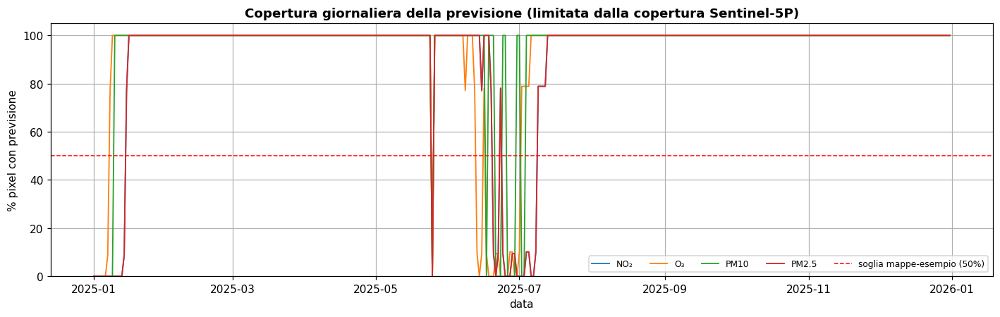

,copertura media [%],copertura mediana [%],giorni con copertura 0 [%],giorni sopra 50%
NO2,90.7000,100.0000,6.6000,332
O3,92.6000,100.0000,4.7000,339
PM10,94.5000,100.0000,5.5000,345
PM25,90.7000,100.0000,6.6000,332


In [11]:
# ── Copertura giornaliera della previsione ───────────────────────────────────
cop_giorno = {}
for var in ORDINE:
    d = PREV[var]
    cop_giorno[var] = (d.groupby('data')['previsione'].apply(lambda s: s.notna().mean())
                        .reindex(CALENDARIO).fillna(0.0))
cop_giorno = pd.DataFrame(cop_giorno)
cop_giorno.index.name = 'data'

fig, ax = plt.subplots(figsize=(13, 4.2))
for var in ORDINE:
    ax.plot(cop_giorno.index, 100 * cop_giorno[var], lw=1.2, label=NOMI[var])
ax.axhline(100 * COPERTURA_MINIMA_MAPPA, color='red', ls='--', lw=1,
           label=f'soglia mappe-esempio ({COPERTURA_MINIMA_MAPPA:.0%})')
ax.set_ylabel('% pixel con previsione')
ax.set_xlabel('data')
ax.set_ylim(0, 105)
ax.set_title('Copertura giornaliera della previsione (limitata dalla copertura Sentinel-5P)',
             fontweight='bold')
ax.legend(fontsize=8, ncol=5)
plt.tight_layout()
plt.savefig(DIR_MAPPE / 'copertura_giornaliera.png', dpi=150, bbox_inches='tight')
plt.show()

riass_cop = pd.DataFrame({
    'copertura media [%]': (100 * cop_giorno.mean()).round(1),
    'copertura mediana [%]': (100 * cop_giorno.median()).round(1),
    'giorni con copertura 0 [%]': (100 * (cop_giorno == 0).mean()).round(1),
    f'giorni sopra {COPERTURA_MINIMA_MAPPA:.0%}': (cop_giorno >= COPERTURA_MINIMA_MAPPA).sum(),
})
display(riass_cop)
cop_giorno.round(4).to_csv(DIR_TABELLE / 'copertura_giornaliera.csv', sep=';', decimal=',')

### 5.2 Cubi giornalieri `(giorno × punto)`

Ogni campo viene messo in forma di **matrice giorno × punto**: 365 righe (calendario continuo) ×
numero di pixel S5P. È questa la struttura su cui si disegnano tutte le mappe, e viene salvata
così com'è: qualsiasi mappa giornaliera è ricostruibile senza rieseguire il modello.

In [12]:
def a_cubo(d, colonna):
    return (d.pivot(index='data', columns='punto_id', values=colonna)
             .reindex(index=CALENDARIO, columns=PUNTI))


CUBO = {}
for var in ORDINE:
    d = PREV[var]
    CUBO[var] = {'arpa': a_cubo(d, 'arpa'),
                 'previsione': a_cubo(d, 'previsione'),
                 'residuo': a_cubo(d, 'residuo'),
                 'previsione_oos': a_cubo(d, 'previsione_oos'),
                 'residuo_oos': a_cubo(d, 'residuo_oos')}
    print(f"{var:5s} cubo {CUBO[var]['arpa'].shape} (giorni x punti) | "
          f"pixel-giorno con residuo: {int(CUBO[var]['residuo'].notna().sum().sum()):,}")

NO2   cubo (365, 1244) (giorni x punti) | pixel-giorno con residuo: 411,899
O3    cubo (365, 1244) (giorni x punti) | pixel-giorno con residuo: 420,607
PM10  cubo (365, 1244) (giorni x punti) | pixel-giorno con residuo: 429,180
PM25  cubo (365, 1244) (giorni x punti) | pixel-giorno con residuo: 411,899


### 5.3 Previsioni negative

L'OLS non è vincolato a valori non negativi: per concentrazioni basse può produrre stime sotto
zero. **Non vengono troncate**: troncare a zero sposterebbe verso l'alto proprio la coda inferiore,
introducendo un bias positivo artificiale nelle statistiche e rendendo il residuo non più
interpretabile. Il numero e l'entità di queste stime sono riportati qui e vanno dichiarati
insieme alle mappe.

In [13]:
righe_neg = []
for var in ORDINE:
    p = PREV[var]['previsione'].dropna()
    neg = p[p < 0]
    righe_neg.append({'Inquinante': var, 'Previsioni valide': len(p),
                      'Previsioni < 0': len(neg),
                      '% < 0': round(100 * len(neg) / max(len(p), 1), 2),
                      'Minimo previsto': round(float(p.min()), 3),
                      'Media |valore| se < 0': round(float(neg.abs().mean()), 3) if len(neg) else 0.0,
                      'Minimo ARPA osservato': round(float(PREV[var]['arpa'].min()), 3)})
tab_neg = pd.DataFrame(righe_neg)
display(tab_neg)
tab_neg.to_csv(DIR_TABELLE / 'previsioni_negative.csv', sep=';', decimal=',', index=False)

,Inquinante,Previsioni valide,Previsioni < 0,% < 0,Minimo previsto,Media |valore| se < 0,Minimo ARPA osservato
0,NO2,411899,13142,3.1900,-2.6160,0.6700,0.0070
1,O3,420607,603,0.1400,-15.6070,3.5610,0.2200
2,PM10,429180,10506,2.4500,-67.4940,3.7180,0.1020
3,PM25,411899,6067,1.4700,-37.9800,1.8950,0.0700


### 5.4 Controllo della convenzione dei residui

Verifica incrociata con `risultati_modello_arpa/modello_sintesi.csv`: quel file riporta il bias
nella convenzione **opposta** (`previsto − osservato`), quindi deve valere

$$\mathrm{Bias}_{\text{qui}} \;=\; -\,\mathrm{Bias}_{\text{modello\_sintesi.csv}}$$

sulle stesse previsioni out-of-sample. Se i due valori non sono opposti, la convenzione non è
quella dichiarata.

In [14]:
PATH_SINTESI = DIR_MODELLO_ARPA / 'modello_sintesi.csv'
if PATH_SINTESI.exists():
    sint = pd.read_csv(PATH_SINTESI, sep=';', decimal=',')
    righe = []
    for var in ORDINE:
        r = PREV[var]['residuo_oos'].dropna()
        rif = sint[sint['Inquinante'] == var]
        bias_rif = float(rif['Bias'].iloc[0]) if len(rif) else np.nan
        righe.append({'Inquinante': var,
                      'Bias qui (ARPA − previsione)': round(float(r.mean()), 4),
                      'Bias notebook modello (previsto − ARPA)': bias_rif,
                      'Somma (attesa ≈ 0)': round(float(r.mean()) + bias_rif, 4),
                      'RMSE qui': round(float(np.sqrt((r ** 2).mean())), 3),
                      'RMSE notebook modello': float(rif['RMSE'].iloc[0]) if len(rif) else np.nan})
    ctrl = pd.DataFrame(righe)
    display(ctrl)
    ok = bool((ctrl['Somma (attesa ≈ 0)'].abs() < 0.02).all())
    print('-> convenzione verificata: i bias sono opposti e gli RMSE coincidono.' if ok else
          'ATTENZIONE: i bias non risultano opposti — controllare la convenzione o i dati di input.')
else:
    print(f'{PATH_SINTESI} non trovato: controllo saltato.')

-> convenzione verificata: i bias sono opposti e gli RMSE coincidono.


,Inquinante,Bias qui (ARPA − previsione),Bias notebook modello (previsto − ARPA),Somma (attesa ≈ 0),RMSE qui,RMSE notebook modello
0,NO2,0.0468,-0.0470,-0.0002,3.6230,3.6200
1,O3,-2.0264,2.0260,-0.0004,9.4580,9.4600
2,PM10,-5.3283,5.3280,-0.0003,13.1040,13.1000
3,PM25,-1.0117,1.0120,0.0003,8.5050,8.5000


### 5.5 Esportazione dei cubi e delle tabelle lunghe

Due formati, con scopi diversi:

- **`.npz` compresso** (`cubi/`): le matrici `giorno × punto` di ARPA, previsione e residuo, più
  le coordinate. È il formato compatto per ridisegnare qualsiasi mappa;
- **`.csv.gz`** (`cubi/`): la stessa informazione in forma lunga `(data, punto_id, lon, lat, …)`,
  leggibile da qualsiasi GIS o foglio di calcolo.

In [15]:
date_str = np.array([d.strftime('%Y-%m-%d') for d in CALENDARIO])
for var in ORDINE:
    np.savez_compressed(
        DIR_CUBI / f'cubo_{var}.npz',
        data=date_str, punto_id=PUNTI.astype(np.int32),
        lon=LON.astype(np.float32), lat=LAT.astype(np.float32),
        arpa=CUBO[var]['arpa'].to_numpy(dtype=np.float32),
        previsione=CUBO[var]['previsione'].to_numpy(dtype=np.float32),
        residuo=CUBO[var]['residuo'].to_numpy(dtype=np.float32),
        previsione_oos=CUBO[var]['previsione_oos'].to_numpy(dtype=np.float32),
        residuo_oos=CUBO[var]['residuo_oos'].to_numpy(dtype=np.float32))

    fuori = PREV[var].copy()
    fuori['data'] = fuori['data'].dt.strftime('%Y-%m-%d')
    for c in ['lon', 'lat', 'arpa', 'previsione', 'previsione_oos', 'residuo', 'residuo_oos']:
        fuori[c] = fuori[c].round(5)
    fuori.to_csv(DIR_CUBI / f'previsione_residui_{var}.csv.gz', sep=';', decimal=',',
                 index=False, compression='gzip')
    print(f'{var:5s} -> cubo_{var}.npz  +  previsione_residui_{var}.csv.gz '
          f'({len(fuori):,} righe)')

print('\nLettura del cubo in un altro script:')
print("  z = np.load('risultati_previsione_2025/cubi/cubo_NO2.npz')")
print("  mappa = z['residuo'][list(z['data']).index('2025-07-15')]   # residui di quel giorno")

NO2   -> cubo_NO2.npz  +  previsione_residui_NO2.csv.gz (454,060 righe)
O3    -> cubo_O3.npz  +  previsione_residui_O3.csv.gz (454,060 righe)
PM10  -> cubo_PM10.npz  +  previsione_residui_PM10.csv.gz (454,060 righe)
PM25  -> cubo_PM25.npz  +  previsione_residui_PM25.csv.gz (454,060 righe)

Lettura del cubo in un altro script:
  z = np.load('risultati_previsione_2025/cubi/cubo_NO2.npz')
  mappa = z['residuo'][list(z['data']).index('2025-07-15')]   # residui di quel giorno


## 6. Mappe giornaliere

### 6.1 Come sono disegnate

- **Un marker = un pixel Sentinel-5P nativo.** Nessun ricampionamento su griglia regolare, nessuna
  interpolazione spaziale, nessun contouring: i punti non coperti restano **vuoti**. La dimensione
  del marker è ricavata dal passo tipico della griglia (§ 2), quindi la mappa appare continua dove
  i dati ci sono e bucata dove mancano.
- **Scale fissate sull'anno**, non sul singolo giorno: i pannelli ARPA e previsione condividono
  la stessa scala (2°–98° percentile annuo di ARPA), così il confronto visivo fra i due pannelli e
  fra giorni diversi è immediato. I valori fuori scala sono indicati dalle frecce della barra dei
  colori.
- **Residui su scala divergente simmetrica** centrata sullo zero (98° percentile di $|r|$): il
  bianco è "errore nullo", il **rosso** è sottostima del modello ($r>0$), il **blu** è sovrastima.
- L'asse è in gradi con **aspetto corretto per la latitudine** ($\Delta x \cdot \cos\varphi$), non
  una proiezione cartografica: le distanze sono corrette localmente, non su tutto il dominio.

In [16]:
LAT_MEDIA = float(np.mean(LAT))
ASPETTO = 1.0 / np.cos(np.deg2rad(LAT_MEDIA))
MARGINE = 0.02
XLIM = (LON.min() - MARGINE, LON.max() + MARGINE)
YLIM = (LAT.min() - MARGINE, LAT.max() + MARGINE)

# Scale di colore fissate sull'anno (robuste ai valori estremi)
SCALA = {}
for var in ORDINE:
    a = CUBO[var]['arpa'].to_numpy()
    r = CUBO[var]['residuo'].to_numpy()
    SCALA[var] = {'vmin': float(np.nanpercentile(a, 2)),
                  'vmax': float(np.nanpercentile(a, 98)),
                  'lim_res': float(np.nanpercentile(np.abs(r), 98))}
display(pd.DataFrame(SCALA).T.rename(columns={'vmin': 'scala min [µg/m³]',
                                              'vmax': 'scala max [µg/m³]',
                                              'lim_res': '±limite residui [µg/m³]'}).round(2))


def _lato_marker(ax):
    # Lato del marker in punti tipografici, tale da coprire circa un pixel S5P.
    fig = ax.figure
    try:
        larghezza_pt = ax.get_window_extent(fig.canvas.get_renderer()).width * 72.0 / fig.dpi
    except Exception:
        larghezza_pt = ax.get_position().width * fig.get_size_inches()[0] * 72.0
    dx = abs(XLIM[1] - XLIM[0])
    lato = PASSO_GRIGLIA / dx * larghezza_pt * 1.40
    return float(np.clip(lato ** 2, 1.0, 400.0))


def pannello_mappa(ax, valori, titolo, cmap, vmin, vmax, etichetta_cb, centrato=False):
    ax.set_xlim(*XLIM)
    ax.set_ylim(*YLIM)
    ax.set_aspect(ASPETTO)
    ax.set_facecolor('#F2F2F2')          # grigio = pixel senza dato
    norm = mcolors.TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax) if centrato else None
    sc = ax.scatter(LON, LAT, c=valori, s=_lato_marker(ax), marker='s', cmap=cmap,
                    vmin=None if centrato else vmin, vmax=None if centrato else vmax,
                    norm=norm, linewidths=0, rasterized=True)
    cb = ax.figure.colorbar(sc, ax=ax, fraction=0.046, pad=0.02, extend='both')
    cb.set_label(etichetta_cb, fontsize=8)
    cb.ax.tick_params(labelsize=8)
    ax.set_title(titolo, fontsize=10, fontweight='bold')
    ax.set_xlabel('lon [°E]', fontsize=8)
    ax.set_ylabel('lat [°N]', fontsize=8)
    ax.tick_params(labelsize=8)
    ax.grid(alpha=0.25)
    return sc


def _riga(cubo, giorno):
    return cubo.loc[giorno].to_numpy() if giorno in cubo.index else np.full(len(PUNTI), np.nan)

,scala min [µg/m³],scala max [µg/m³],±limite residui [µg/m³]
NO2,0.0300,19.3500,10.5800
O3,4.5300,74.5800,20.4100
PM10,1.0800,58.7500,34.1600
PM25,0.8000,45.1500,25.5400


In [17]:
def mappa_tripla(var, giorno, suffisso_oos=False, salva=None, mostra=True, titolo_extra=''):
    # Tre pannelli sulla stessa griglia: ARPA osservato, previsione, residuo = ARPA − previsione.
    campo_prev = 'previsione_oos' if suffisso_oos else 'previsione'
    campo_res = 'residuo_oos' if suffisso_oos else 'residuo'
    giorno = pd.Timestamp(giorno)
    a = _riga(CUBO[var]['arpa'], giorno)
    p = _riga(CUBO[var][campo_prev], giorno)
    r = _riga(CUBO[var][campo_res], giorno)
    s = SCALA[var]
    n_val = int(np.isfinite(r).sum())
    quota = 100 * n_val / len(PUNTI)

    fig, axes = plt.subplots(1, 3, figsize=(17, 5.4))
    pannello_mappa(axes[0], a, f'ARPA osservato\nmedia {np.nanmean(a):.1f} µg/m³',
                   CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var])
    pannello_mappa(axes[1], p,
                   f"Previsione{' out-of-sample' if suffisso_oos else ''}\n"
                   f'media {np.nanmean(p):.1f} µg/m³',
                   CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var])
    pannello_mappa(axes[2], r,
                   f'Residuo = ARPA − previsione\nmedia {np.nanmean(r):+.1f} µg/m³  '
                   f'MAE {np.nanmean(np.abs(r)):.1f}',
                   CMAP_RES, -s['lim_res'], s['lim_res'],
                   'residuo [µg/m³]  (>0 sottostima)')
    fig.suptitle(f'{NOMI[var]} — {giorno.date()}   ·   pixel con previsione: '
                 f'{n_val:,}/{len(PUNTI):,} ({quota:.0f}%){titolo_extra}',
                 fontweight='bold', y=1.02)
    plt.tight_layout()
    if salva is not None:
        plt.savefig(salva, dpi=140, bbox_inches='tight')
    if mostra:
        plt.show()
    else:
        plt.close(fig)


print('Funzione mappa_tripla(var, giorno) pronta.')
print("Esempio d'uso interattivo:  mappa_tripla('NO2', '2025-07-15')")

Funzione mappa_tripla(var, giorno) pronta.
Esempio d'uso interattivo:  mappa_tripla('NO2', '2025-07-15')


### 6.2 Copertura spaziale: dove la previsione esiste più spesso

Prima delle mappe di valore, la mappa che dice **quanto ci si può fidare della copertura** in
ciascun pixel: la quota di giorni dell'anno in cui quel pixel ha una previsione. Un pixel con
copertura bassa avrà statistiche d'errore stimate su pochi giorni, e le sue metriche vanno lette
con la numerosità accanto.

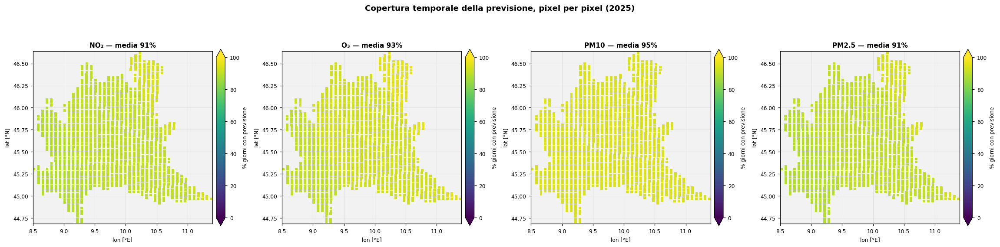

In [18]:
fig, axes = plt.subplots(1, 4, figsize=(21, 5.0))
for ax, var in zip(axes, ORDINE):
    quota = 100 * CUBO[var]['previsione'].notna().mean(axis=0).to_numpy()
    pannello_mappa(ax, quota, f'{NOMI[var]} — media {quota.mean():.0f}%',
                   'viridis', 0, 100, '% giorni con previsione')
fig.suptitle('Copertura temporale della previsione, pixel per pixel (2025)',
             fontweight='bold', y=1.03)
plt.tight_layout()
plt.savefig(DIR_MAPPE / 'copertura_spaziale.png', dpi=150, bbox_inches='tight')
plt.show()

### 6.3 Giorni selezionati

Per ogni inquinante si esportano sette giorni, scelti **solo fra quelli con copertura sopra la
soglia** (§ 1), così che la mappa sia leggibile:

| criterio | perché |
|---|---|
| 4 giorni stagionali (metà gennaio, aprile, luglio, ottobre) | comportamento tipico nelle quattro stagioni |
| giorno con il **massimo bias positivo** | peggiore sottostima: il modello è troppo basso |
| giorno con il **massimo bias negativo** | peggiore sovrastima |
| giorno con il **massimo livello ARPA medio** | episodio di picco, il caso che interessa per gli allarmi |

Il criterio è dichiarato perché la scelta dei giorni-esempio è una scelta di comunicazione: mostrare
solo i giorni buoni renderebbe il modello migliore di quanto sia.

In [19]:
def giorno_valido_vicino(var, riferimento, ammessi):
    # Giorno ammesso più vicino alla data di riferimento (fra quelli con copertura sufficiente).
    riferimento = pd.Timestamp(riferimento)
    if len(ammessi) == 0:
        return None
    return min(ammessi, key=lambda g: abs((g - riferimento).days))


GIORNI_SCELTI = {}
righe_scelta = []
for var in ORDINE:
    d = PREV[var].dropna(subset=['residuo'])
    per_giorno = d.groupby('data').agg(bias=('residuo', 'mean'), arpa=('arpa', 'mean'),
                                       n=('residuo', 'size'))
    per_giorno['copertura'] = per_giorno['n'] / len(PUNTI)
    ammessi = list(per_giorno.index[per_giorno['copertura'] >= COPERTURA_MINIMA_MAPPA])
    if len(ammessi) == 0:                       # soglia troppo severa per questo inquinante
        ammessi = list(per_giorno.sort_values('copertura').index[-30:])
    amm = per_giorno.loc[ammessi]

    scelte = []
    for etichetta, rif in [('inverno (metà gennaio)', '2025-01-15'),
                           ('primavera (metà aprile)', '2025-04-15'),
                           ('estate (metà luglio)', '2025-07-15'),
                           ('autunno (metà ottobre)', '2025-10-15')]:
        g = giorno_valido_vicino(var, rif, ammessi)
        if g is not None:
            scelte.append((etichetta, g))
    scelte.append(('massima sottostima (bias +)', amm['bias'].idxmax()))
    scelte.append(('massima sovrastima (bias −)', amm['bias'].idxmin()))
    scelte.append(('episodio: massimo livello ARPA', amm['arpa'].idxmax()))

    viste, uniche = set(), []
    for et, g in scelte:
        if g not in viste:
            viste.add(g)
            uniche.append((et, g))
    GIORNI_SCELTI[var] = uniche
    for et, g in uniche:
        righe_scelta.append({'Inquinante': var, 'criterio': et, 'giorno': g.date(),
                             'copertura [%]': round(100 * per_giorno.loc[g, 'copertura'], 1),
                             'ARPA medio': round(per_giorno.loc[g, 'arpa'], 2),
                             'bias medio (ARPA − prev)': round(per_giorno.loc[g, 'bias'], 2)})

tab_scelta = pd.DataFrame(righe_scelta)
display(tab_scelta)
tab_scelta.to_csv(DIR_TABELLE / 'giorni_selezionati.csv', sep=';', decimal=',', index=False)

,Inquinante,criterio,giorno,copertura [%],ARPA medio,bias medio (ARPA − prev)
0,NO2,inverno (metà gennaio),2025-01-15,77.0000,9.2600,-2.8500
1,NO2,primavera (metà aprile),2025-04-15,100.0000,5.0400,0.9700
2,NO2,estate (metà luglio),2025-07-15,100.0000,2.3400,-0.4400
3,NO2,autunno (metà ottobre),2025-10-15,100.0000,4.3200,0.3100
4,NO2,massima sottostima (bias +),2025-12-15,100.0000,11.5300,4.8000
5,NO2,massima sovrastima (bias −),2025-01-17,100.0000,7.7300,-5.4800
6,O3,inverno (metà gennaio),2025-01-15,100.0000,22.4000,8.0300
7,O3,primavera (metà aprile),2025-04-15,100.0000,26.5200,-3.2600
8,O3,estate (metà luglio),2025-07-15,100.0000,55.3100,-0.2600
9,O3,autunno (metà ottobre),2025-10-15,100.0000,33.7200,0.2700


#### NO₂

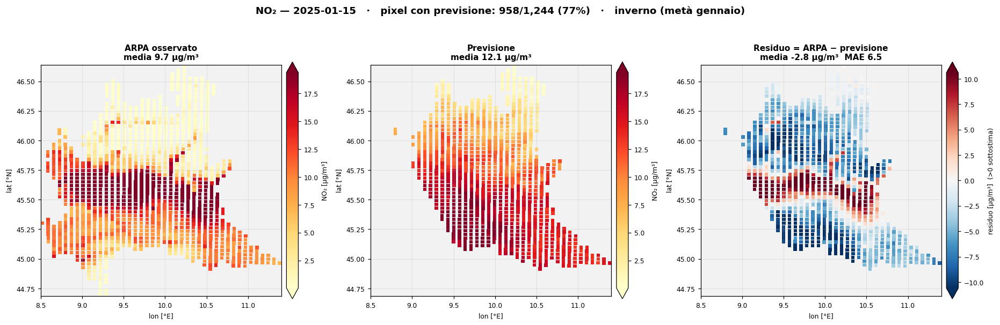

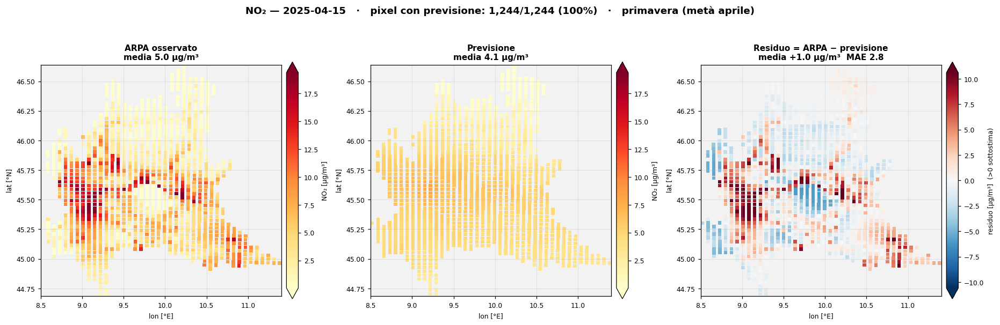

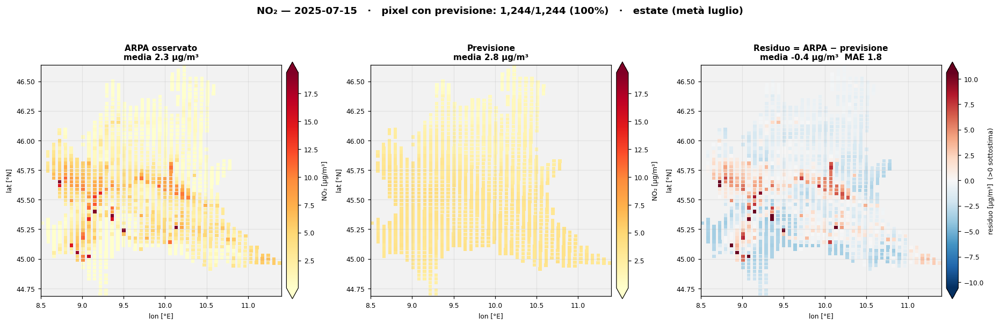

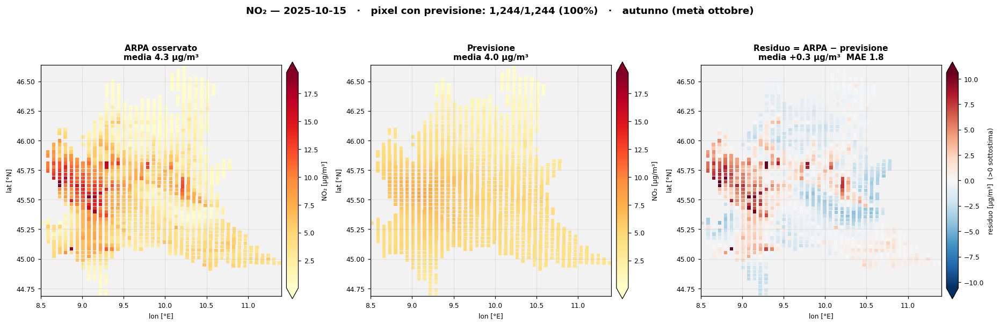

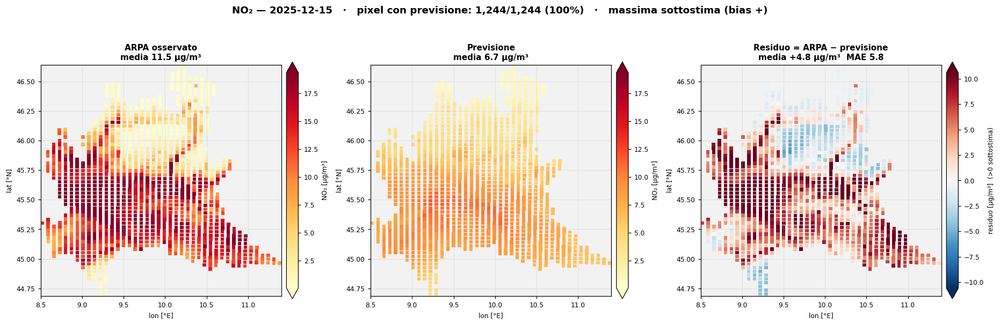

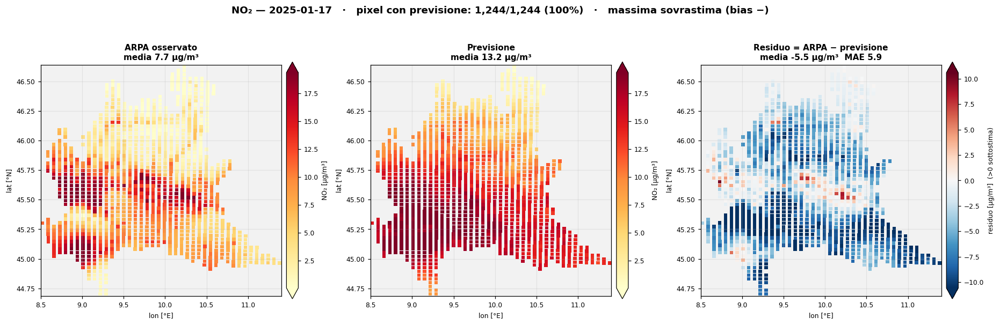

#### O₃

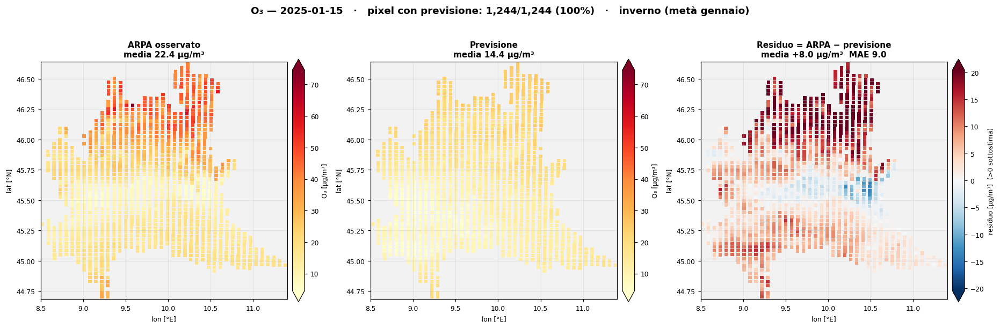

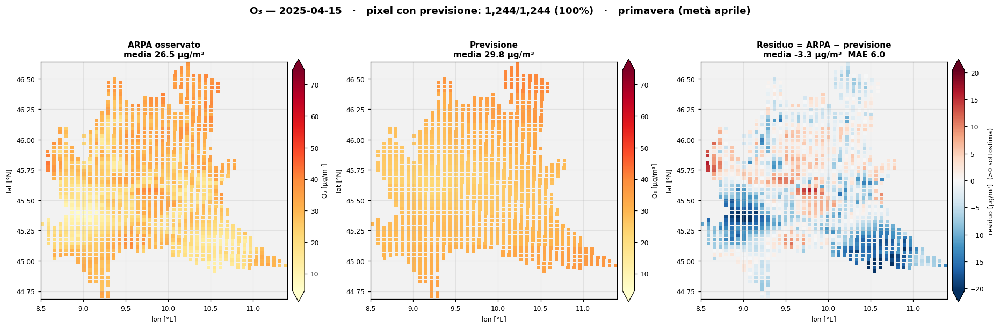

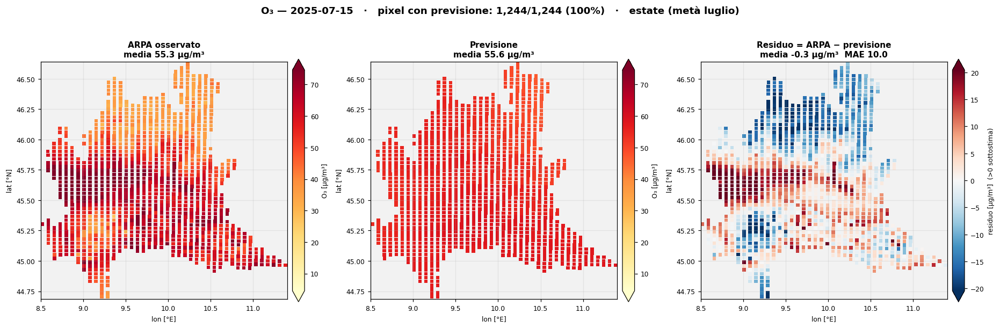

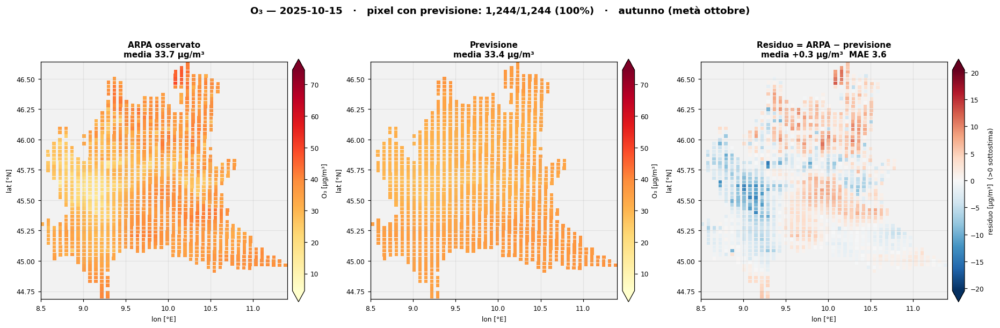

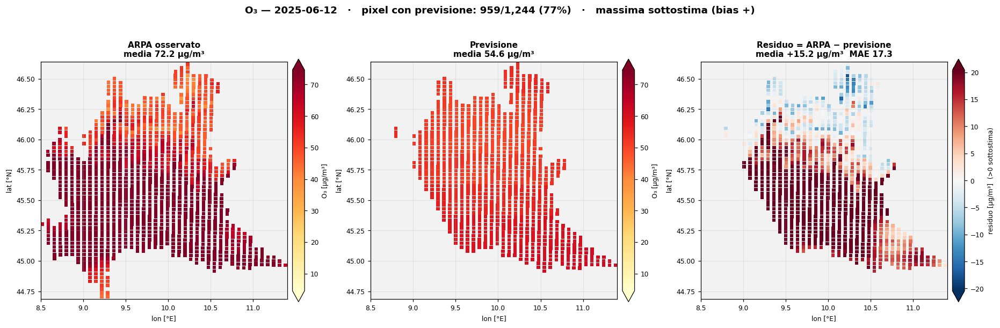

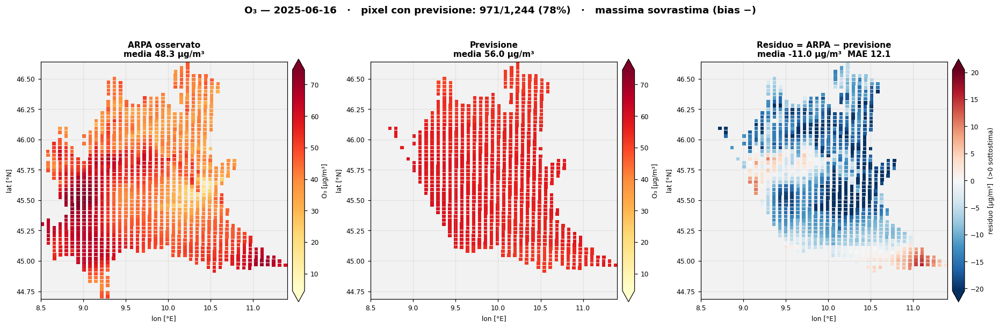

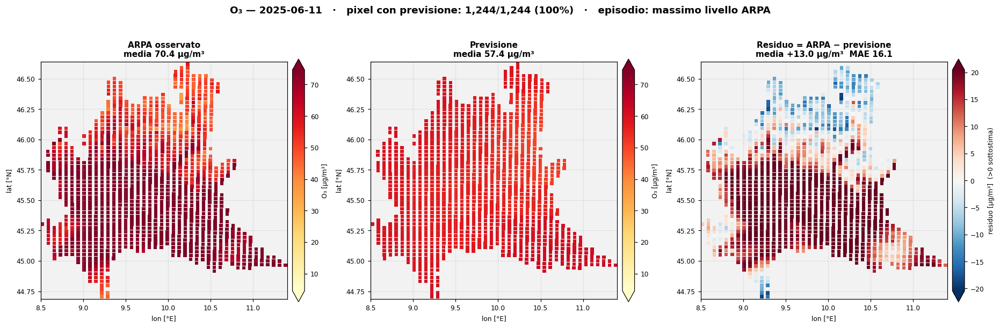

#### PM10

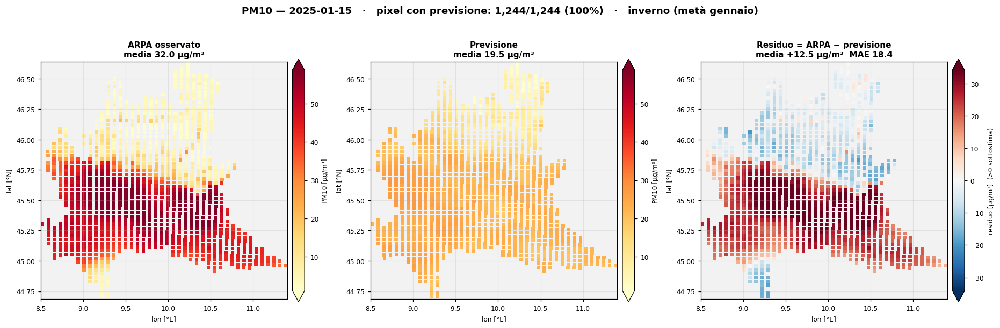

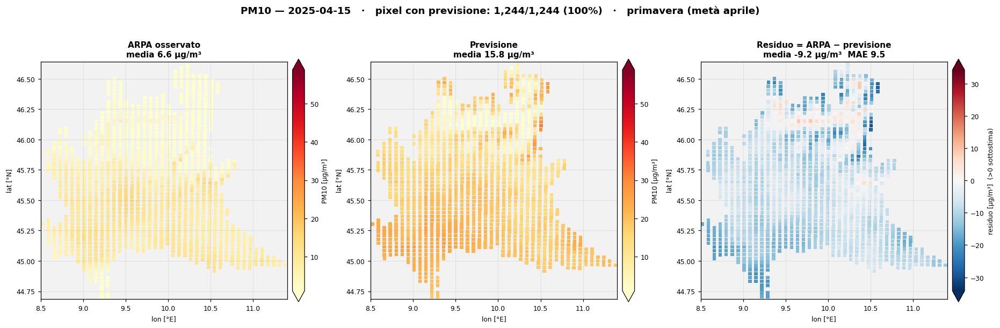

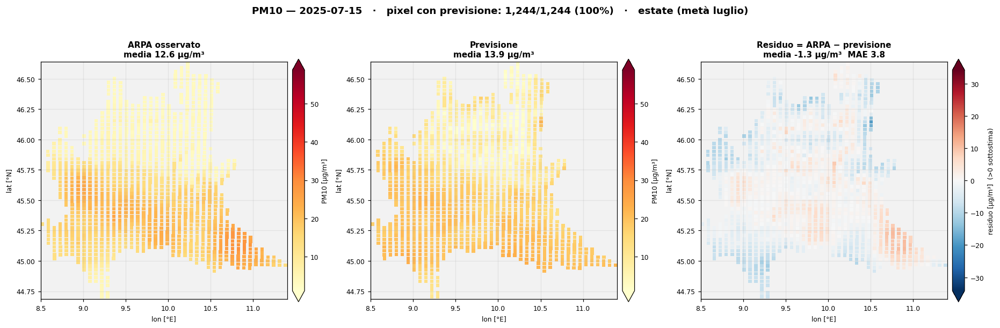

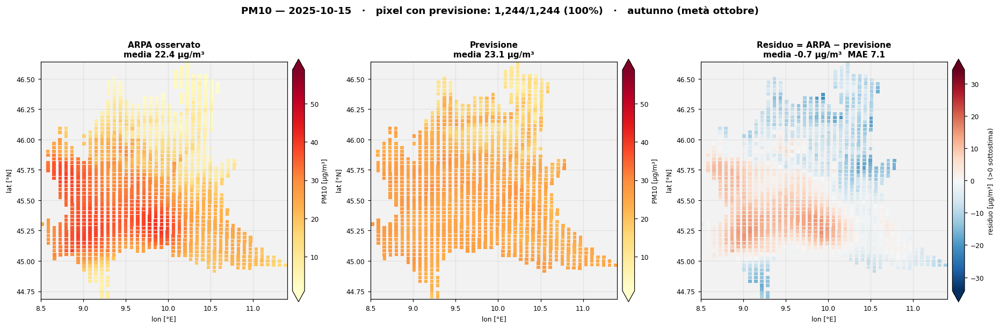

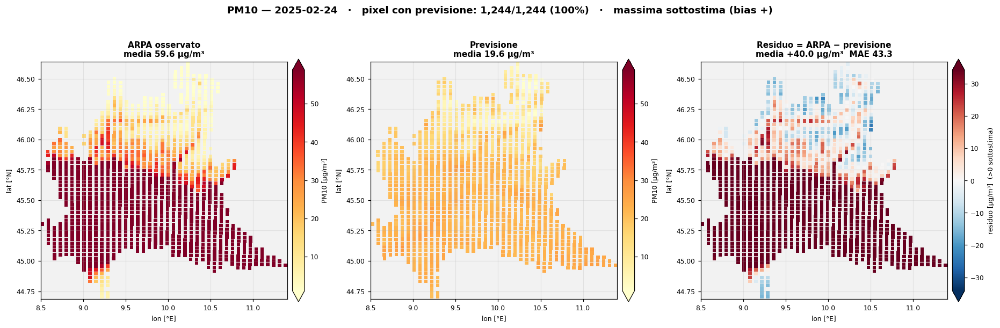

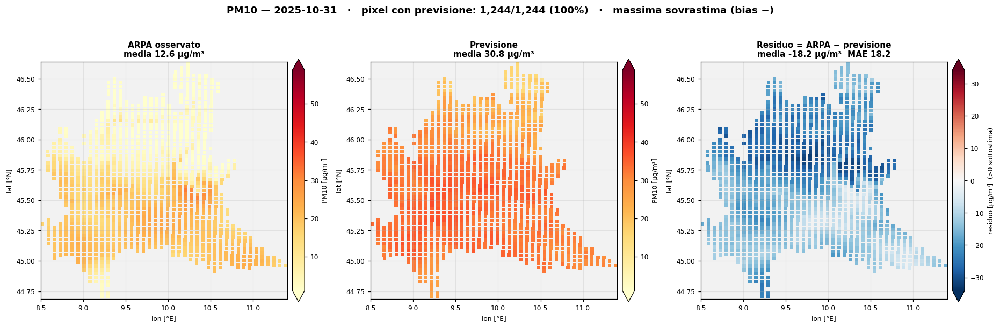

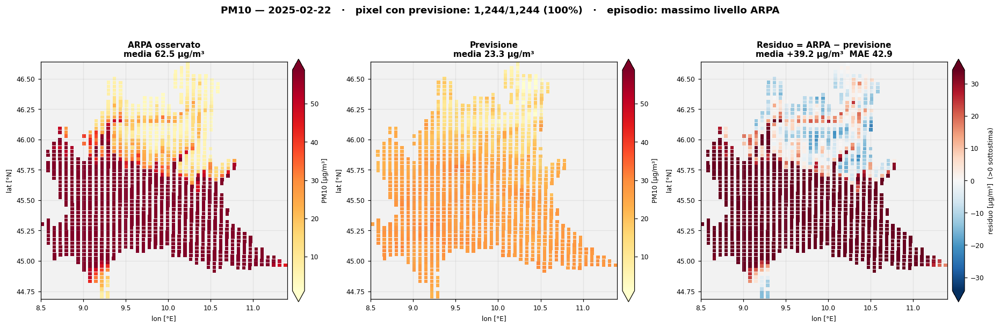

#### PM2.5

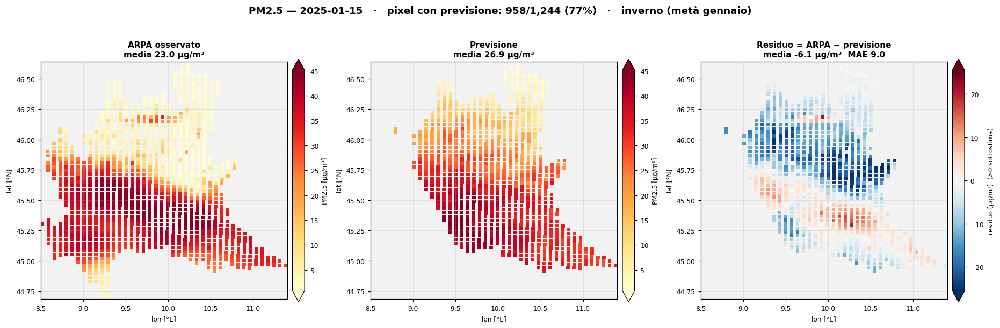

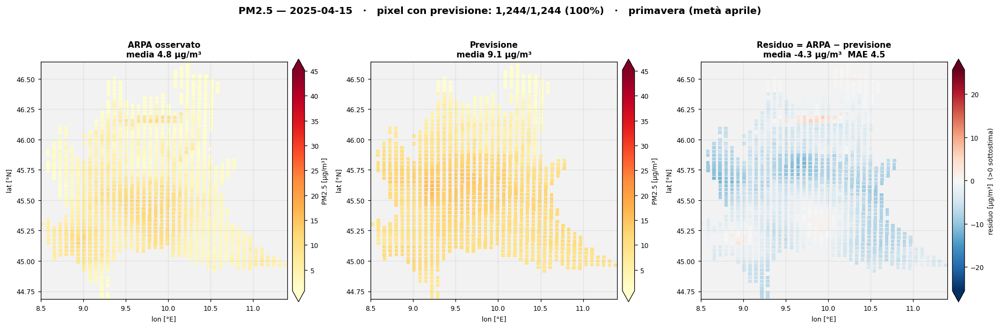

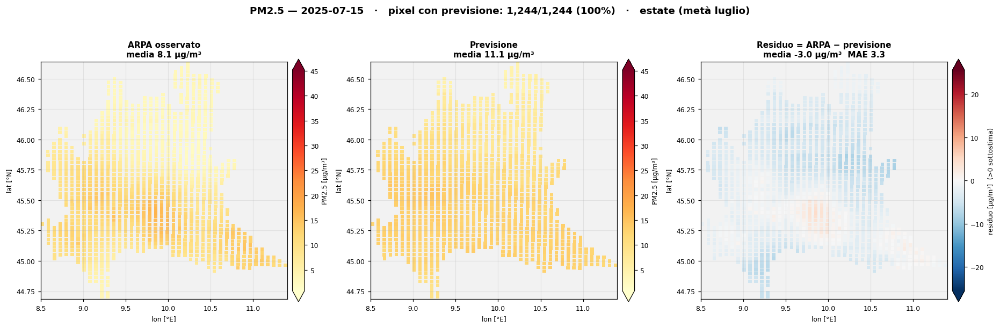

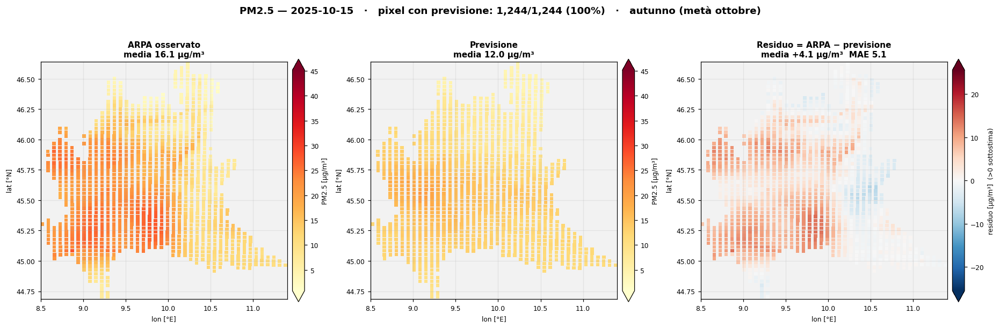

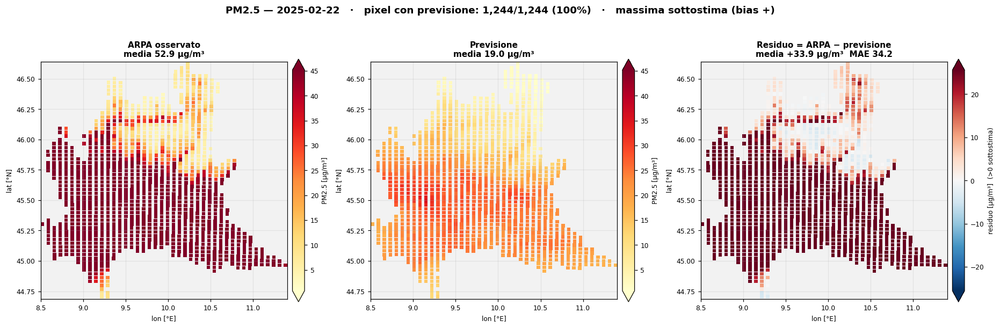

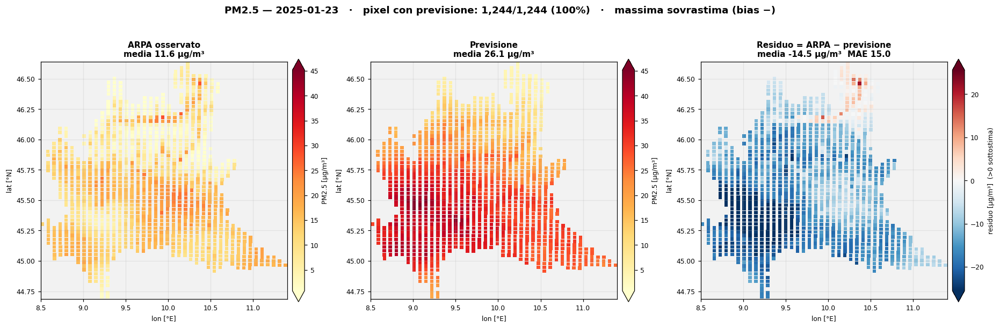

In [20]:
for var in ORDINE:
    display(Markdown(f'#### {NOMI[var]}'))
    for etichetta, g in GIORNI_SCELTI[var]:
        nome_file = DIR_MAPPE_GIORNALIERE / f"{var}_{g.strftime('%Y%m%d')}.png"
        mappa_tripla(var, g, salva=nome_file, titolo_extra=f'   ·   {etichetta}')

### 6.4 Esportazione di tutti i giorni dell'anno

Il cubo giornaliero è già salvato (§ 5.5), quindi le 1.460 figure non sono necessarie per avere le
mappe: servono solo se si vuole un archivio di immagini già renderizzate. L'esportazione completa
si attiva con `ESPORTA_TUTTI_I_GIORNI = True` nel § 1 (richiede alcuni minuti e scrive circa 1.460
file PNG in `mappe/giornaliere/`).

In [21]:
if ESPORTA_TUTTI_I_GIORNI:
    import time
    t0 = time.time()
    n = 0
    for var in ORDINE:
        for g in CALENDARIO:
            if not np.isfinite(_riga(CUBO[var]['previsione'], g)).any():
                continue          # giorno senza alcun pixel previsto: nessuna mappa da salvare
            mappa_tripla(var, g, salva=DIR_MAPPE_GIORNALIERE / f"{var}_{g.strftime('%Y%m%d')}.png",
                         mostra=False)
            n += 1
        print(f'{var}: esportazione completata')
    print(f'\n{n:,} figure salvate in {DIR_MAPPE_GIORNALIERE} in {time.time() - t0:.0f} s')
else:
    n_attese = sum(int((CUBO[v]['previsione'].notna().any(axis=1)).sum()) for v in ORDINE)
    print('Esportazione completa disattivata (ESPORTA_TUTTI_I_GIORNI = False).')
    print(f'Se attivata scriverebbe {n_attese:,} figure a tre pannelli.')
    print(f"Esportate finora solo le mappe dei giorni selezionati: "
          f'{len(list(DIR_MAPPE_GIORNALIERE.glob("*.png"))):,} file.')

Esportazione completa disattivata (ESPORTA_TUTTI_I_GIORNI = False).
Se attivata scriverebbe 1,375 figure a tre pannelli.
Esportate finora solo le mappe dei giorni selezionati: 26 file.


## 7. Sintesi cartografiche: medie mensili e annuali

Le mappe giornaliere sono rumorose e con buchi diversi ogni giorno. Le **medie mensili** e la
**media annuale** aggregano nel tempo *lo stesso pixel*, quindi restano alla risoluzione nativa
S5P ma con copertura molto più alta.

**Avvertenza sull'aggregazione.** La media mensile del residuo è calcolata **solo sui giorni in
cui la previsione esiste**: se in un pixel la copertura è concentrata nei giorni sereni, la media
di quel pixel descrive le condizioni serene, non il mese. Per questo la mappa di copertura
(§ 6.2) va letta insieme a queste.

#### NO₂ — medie mensili

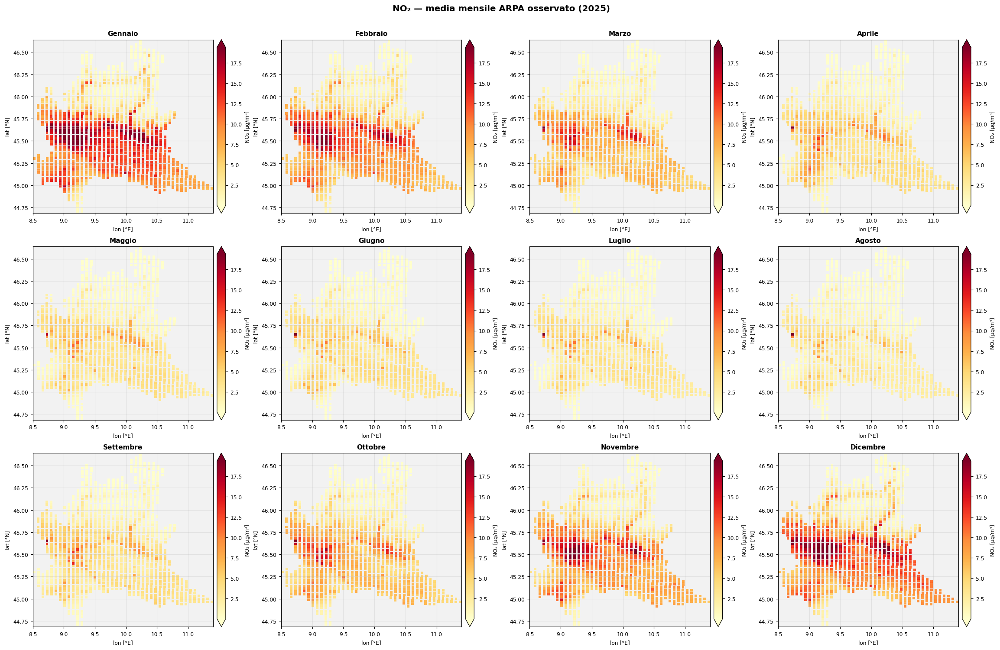

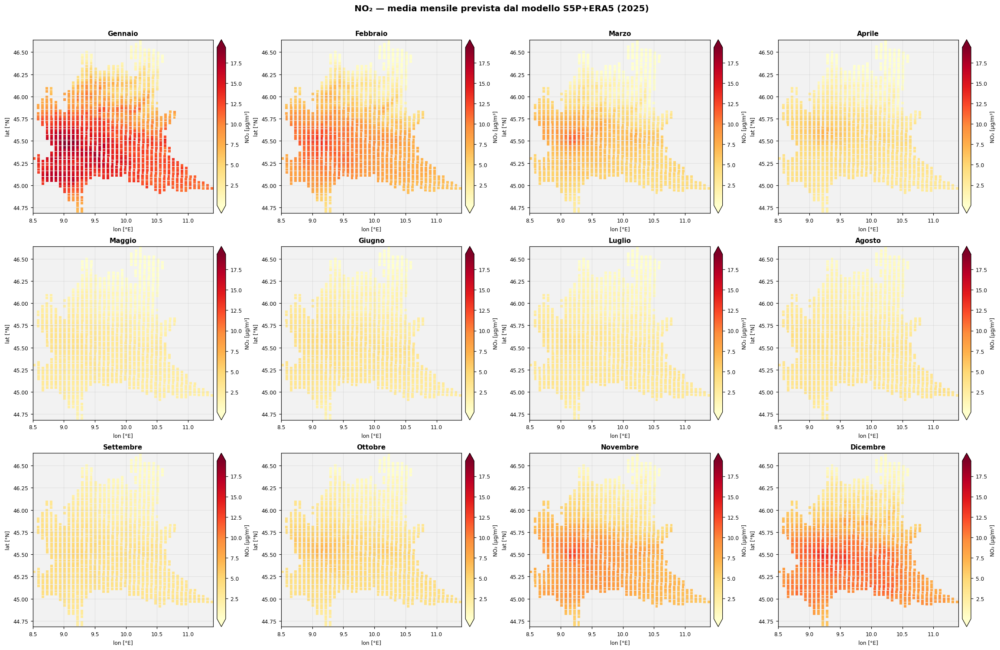

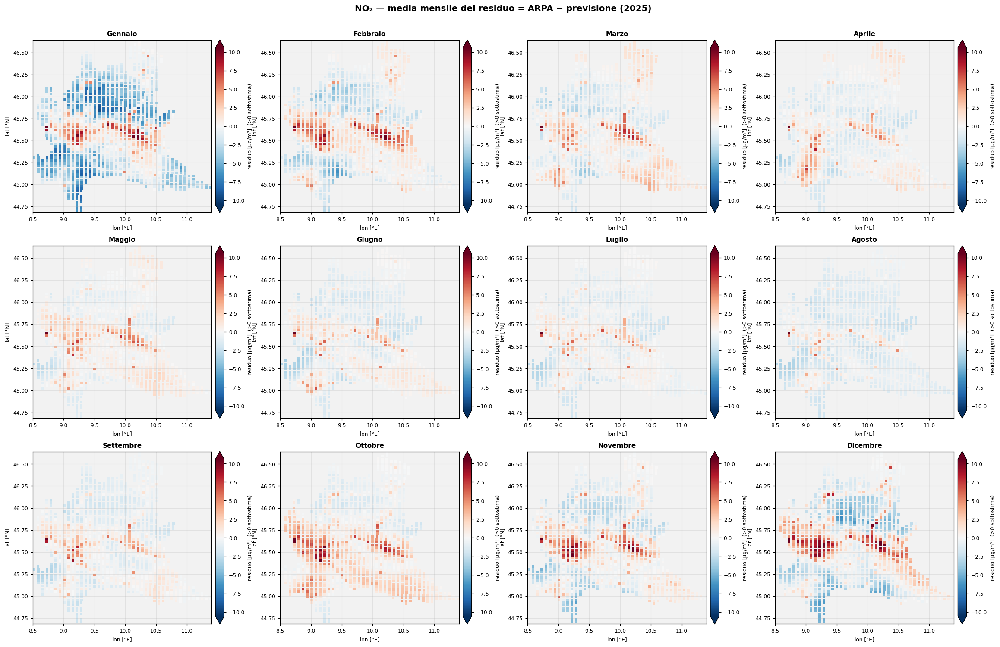

#### O₃ — medie mensili

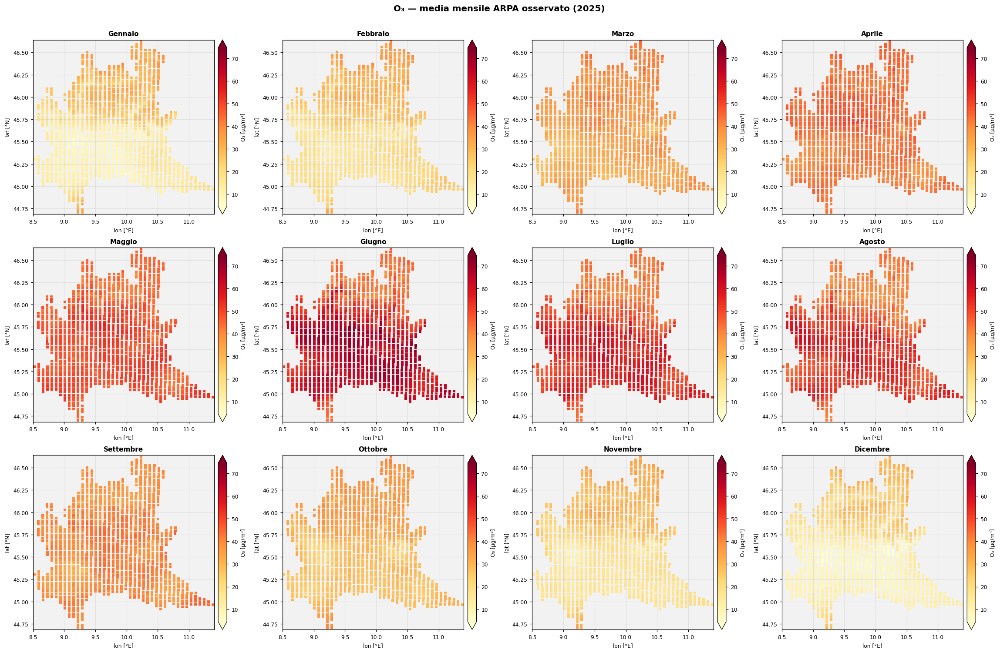

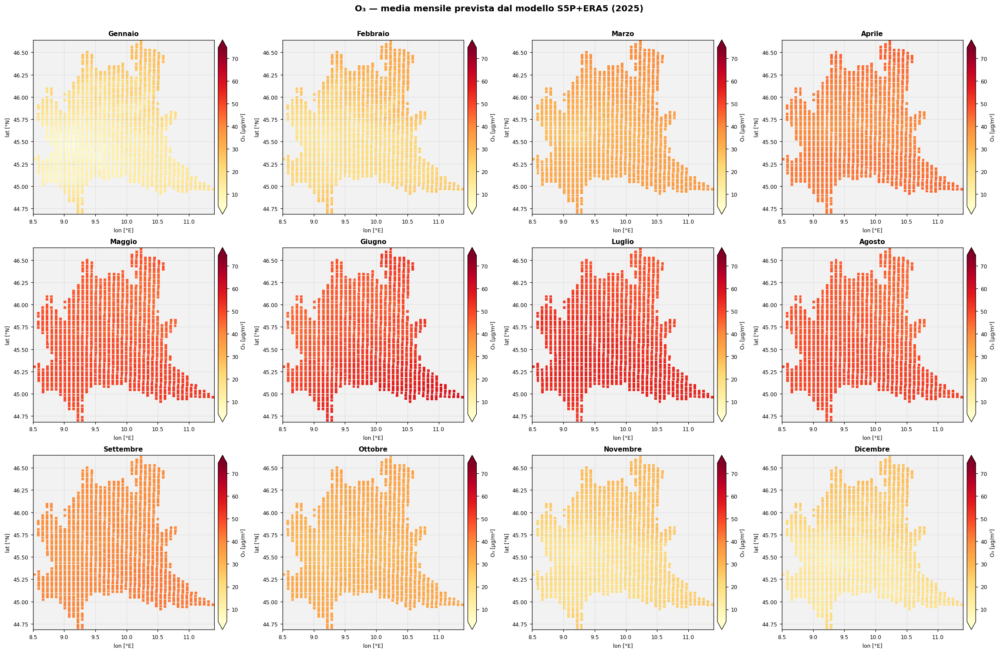

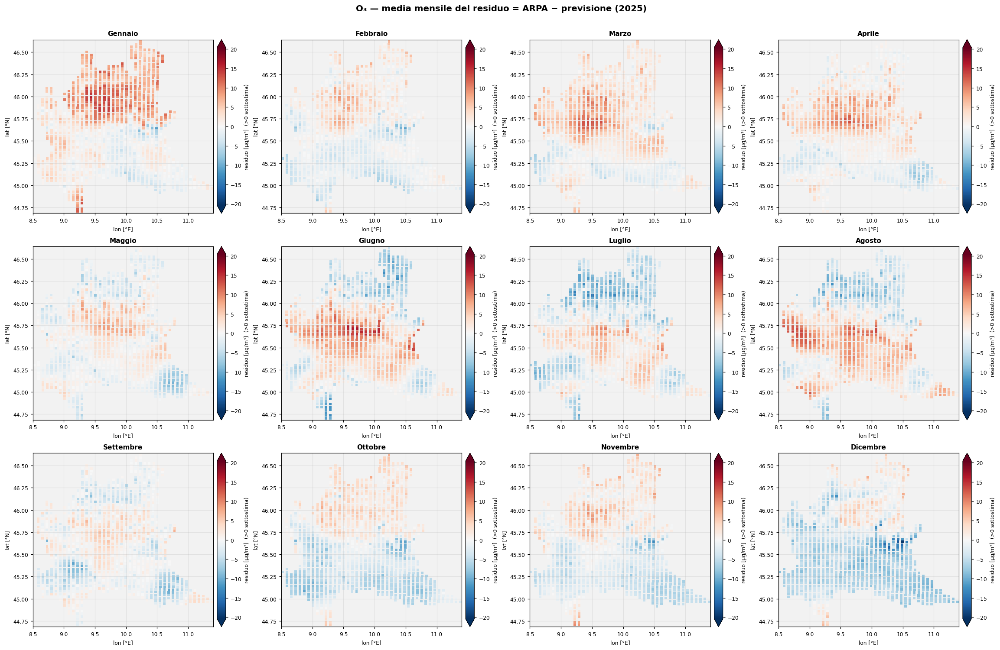

#### PM10 — medie mensili

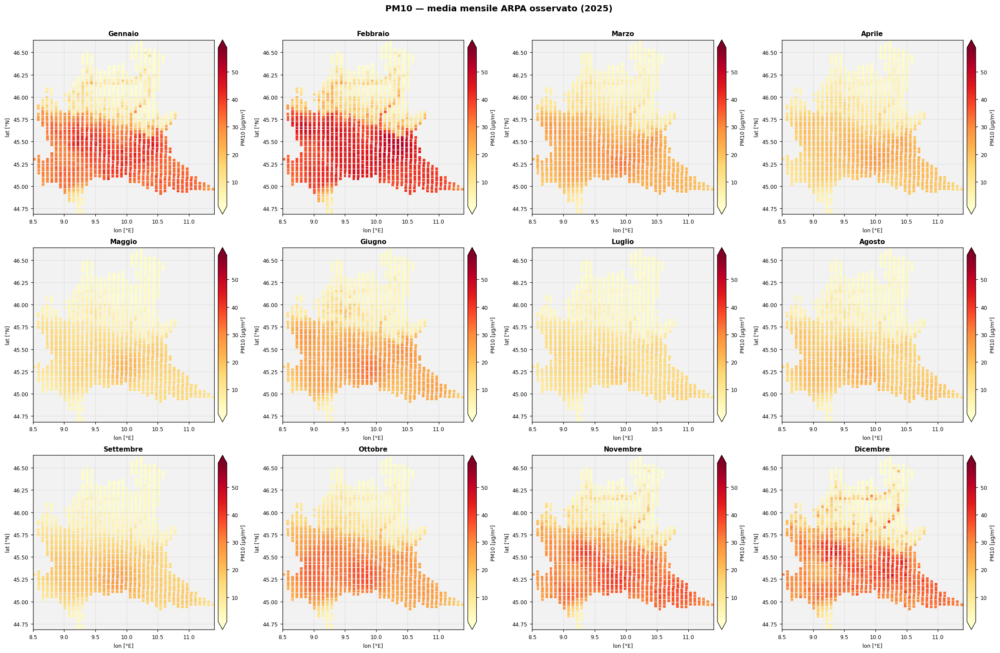

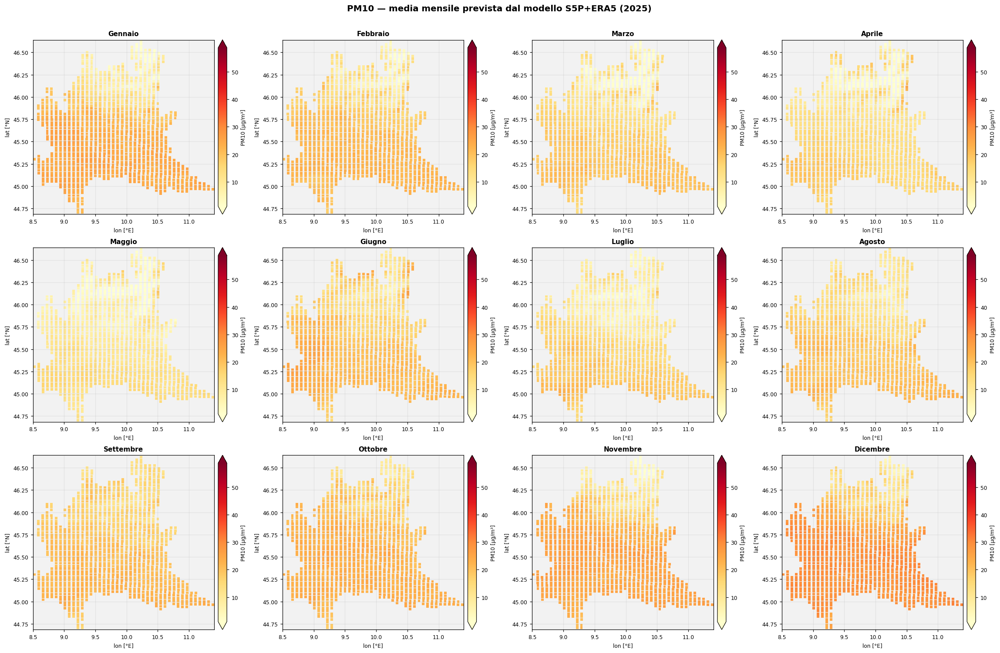

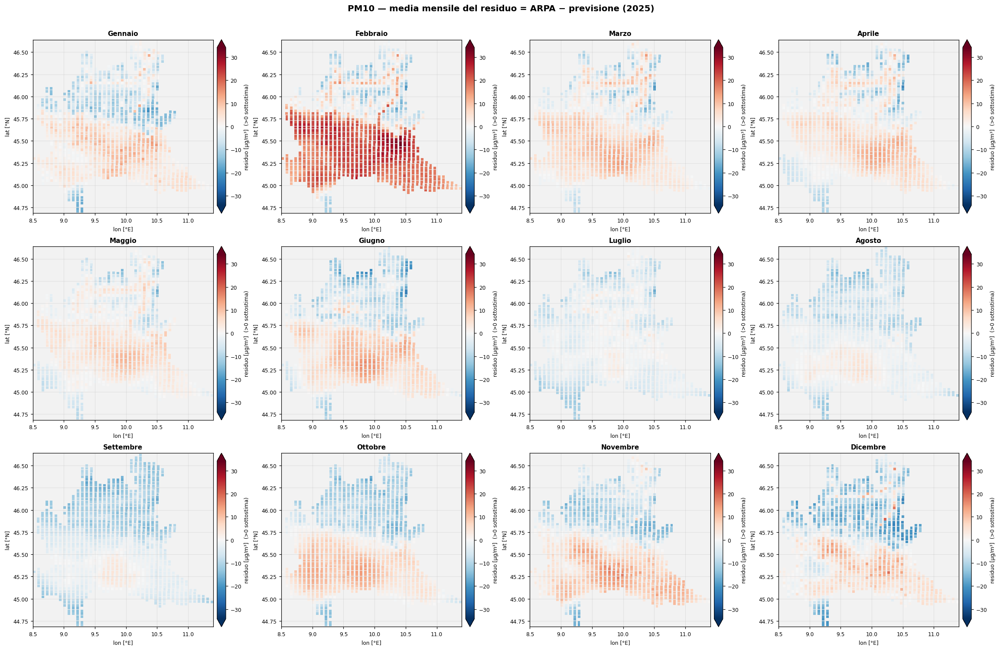

#### PM2.5 — medie mensili

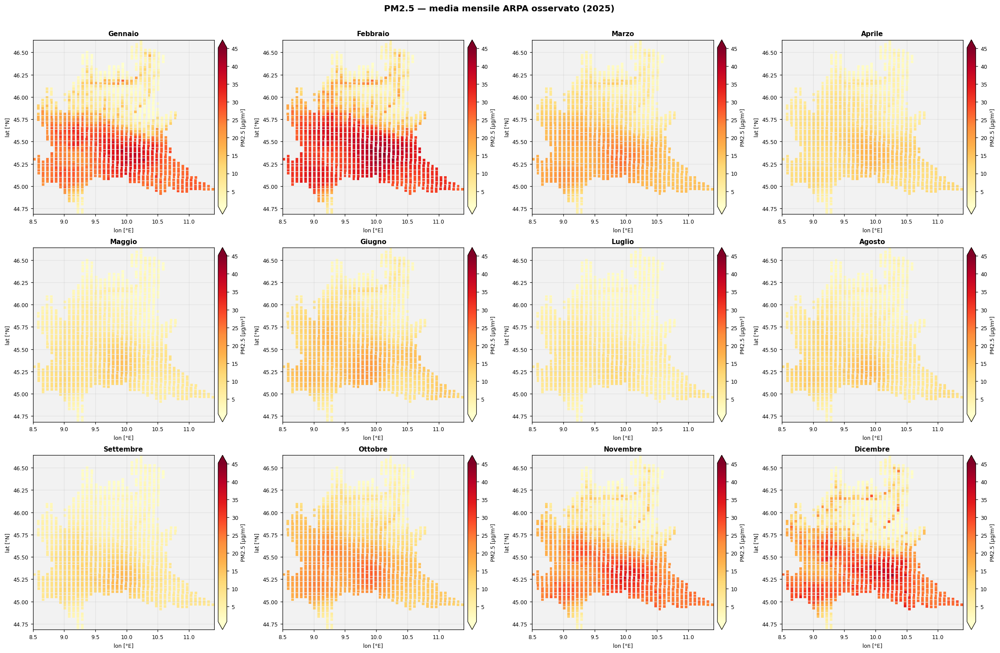

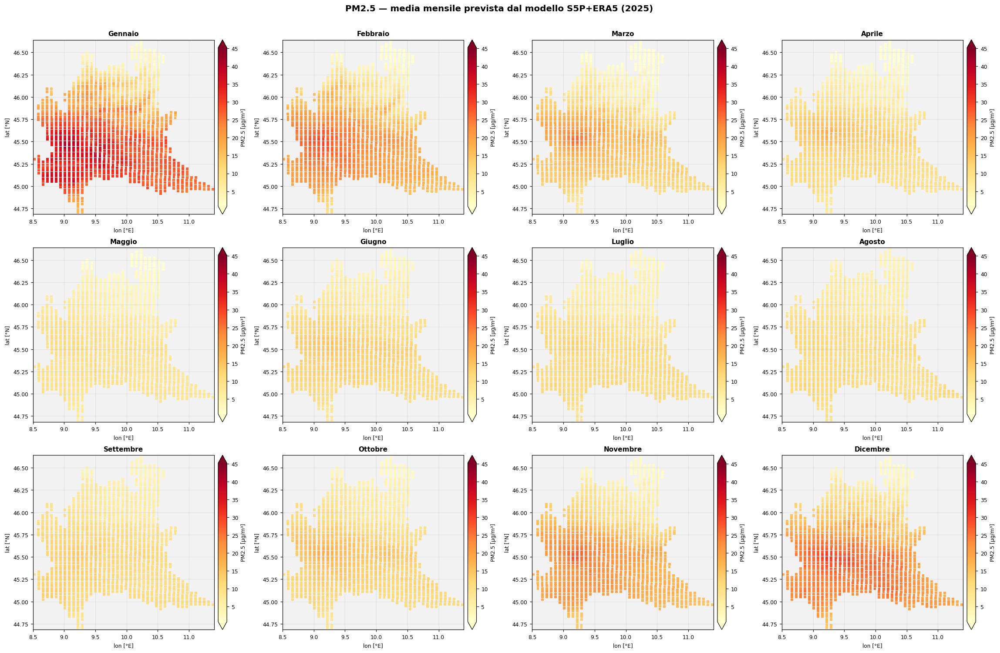

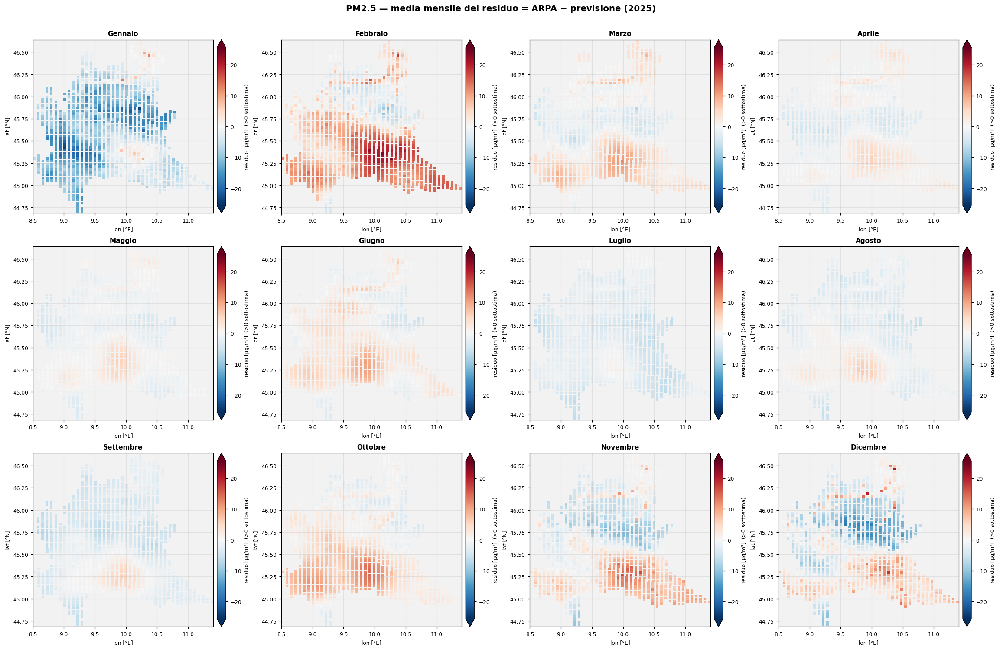

In [22]:
def medie_mensili(var, campo):
    c = CUBO[var][campo]
    return c.groupby(c.index.month).mean()


def griglia_mensile(var, campo, cmap, vmin, vmax, etichetta_cb, titolo, nome_file, centrato=False):
    mens = medie_mensili(var, campo)
    fig, axes = plt.subplots(3, 4, figsize=(21, 13.5))
    for m, ax in zip(range(1, 13), axes.ravel()):
        valori = mens.loc[m].to_numpy() if m in mens.index else np.full(len(PUNTI), np.nan)
        pannello_mappa(ax, valori, MESI_IT[m - 1].capitalize(), cmap, vmin, vmax,
                       etichetta_cb, centrato=centrato)
    fig.suptitle(titolo, fontweight='bold', y=1.005, fontsize=13)
    plt.tight_layout()
    plt.savefig(nome_file, dpi=130, bbox_inches='tight')
    plt.show()


for var in ORDINE:
    s = SCALA[var]
    display(Markdown(f'#### {NOMI[var]} — medie mensili'))
    griglia_mensile(var, 'arpa', CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var],
                    f'{NOMI[var]} — media mensile ARPA osservato (2025)',
                    DIR_MAPPE / f'mensile_{var}_arpa.png')
    griglia_mensile(var, 'previsione', CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var],
                    f'{NOMI[var]} — media mensile prevista dal modello S5P+ERA5 (2025)',
                    DIR_MAPPE / f'mensile_{var}_previsione.png')
    griglia_mensile(var, 'residuo', CMAP_RES, -s['lim_res'], s['lim_res'],
                    'residuo [µg/m³]  (>0 sottostima)',
                    f'{NOMI[var]} — media mensile del residuo = ARPA − previsione (2025)',
                    DIR_MAPPE / f'mensile_{var}_residuo.png')

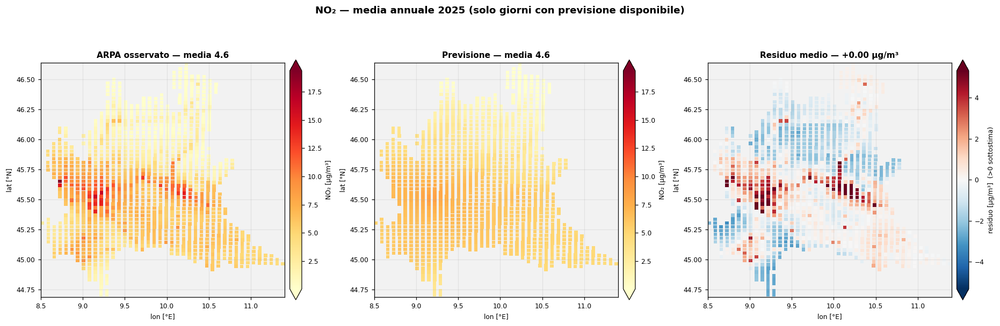

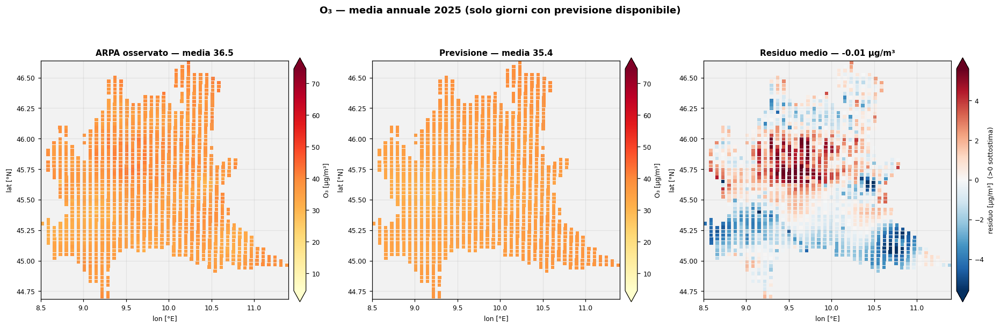

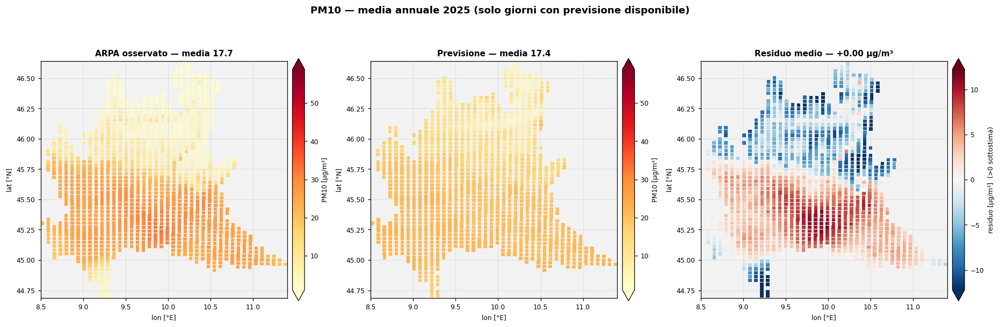

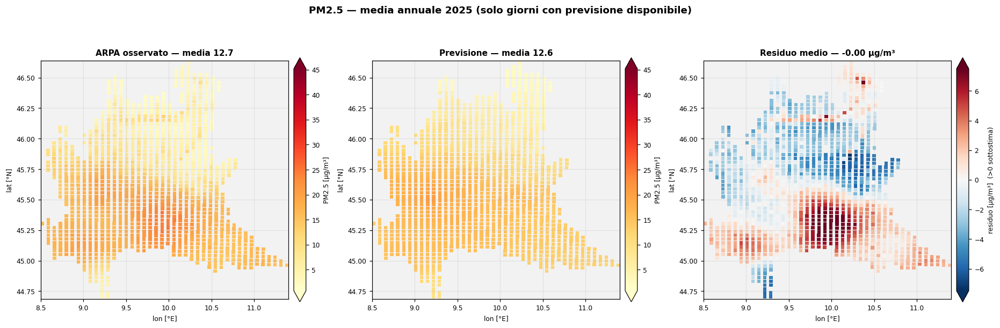

In [23]:
# ── Media annuale: i tre campi affiancati ────────────────────────────────────
for var in ORDINE:
    s = SCALA[var]
    a = CUBO[var]['arpa'].mean(axis=0).to_numpy()
    p = CUBO[var]['previsione'].mean(axis=0).to_numpy()
    r = CUBO[var]['residuo'].mean(axis=0).to_numpy()

    fig, axes = plt.subplots(1, 3, figsize=(17, 5.4))
    pannello_mappa(axes[0], a, f'ARPA osservato — media {np.nanmean(a):.1f}',
                   CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var])
    pannello_mappa(axes[1], p, f'Previsione — media {np.nanmean(p):.1f}',
                   CMAP_CONC, s['vmin'], s['vmax'], ETICHETTE_UM[var])
    pannello_mappa(axes[2], r,
                   f'Residuo medio — {np.nanmean(r):+.2f} µg/m³',
                   CMAP_RES, -np.nanpercentile(np.abs(r), 98),
                   np.nanpercentile(np.abs(r), 98), 'residuo [µg/m³]  (>0 sottostima)')
    fig.suptitle(f'{NOMI[var]} — media annuale 2025 (solo giorni con previsione disponibile)',
                 fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig(DIR_MAPPE / f'annuale_{var}.png', dpi=150, bbox_inches='tight')
    plt.show()

## 8. Statistiche d'errore

Tutte le metriche sono calcolate sul residuo $r = \mathrm{ARPA} - \widehat{\mathrm{ARPA}}$:

$$\mathrm{Bias}=\overline{r}\qquad
\mathrm{MAE}=\overline{|r|}\qquad
\mathrm{RMSE}=\sqrt{\overline{r^{2}}}\qquad
R^{2}=1-\frac{\sum r^{2}}{\sum(\mathrm{ARPA}-\overline{\mathrm{ARPA}})^{2}}$$

$$\mathrm{NMB}=\frac{\sum r}{\sum \mathrm{ARPA}}\quad\text{(bias normalizzato, }>0=\text{sottostima)}
\qquad
\mathrm{NRMSE}=\frac{\mathrm{RMSE}}{\overline{\mathrm{ARPA}}}$$

Si riporta anche la **correlazione di Pearson** fra osservato e previsto: misura la capacità di
riprodurre la *forma* del campo, indipendentemente da uno scarto di livello. Un modello con
correlazione alta e bias grande sbaglia il livello ma non il pattern — è un errore diverso, e si
corregge diversamente, da un modello con correlazione bassa.

> **Il bias della riga "modello finale (tutto il 2025)" è zero per costruzione, non per merito.**
> Un OLS **con intercetta** ha residui a somma nulla sul campione su cui è stimato: sull'intero
> 2025 media della previsione e media di ARPA coincidono necessariamente, quindi `Bias ≈ 0` e
> `NMB ≈ 0` (a meno dell'errore di arrotondamento numerico, dell'ordine di 10⁻¹⁰). Quel valore
> **non** è una prova che il modello sia non distorto: è un'identità algebrica. L'unico bias
> informativo è quello delle righe **out-of-sample**, dove la media non è vincolata.

In [24]:
def metriche(y, p):
    y = np.asarray(y, float)
    p = np.asarray(p, float)
    m = np.isfinite(y) & np.isfinite(p)
    y, p = y[m], p[m]
    if len(y) < 2:
        return {k: np.nan for k in ['n', 'media ARPA', 'media previsione', 'Bias', 'MAE',
                                    'RMSE', 'R2', 'r Pearson', 'NMB [%]', 'NRMSE [%]']} | {'n': len(y)}
    r = y - p                                   # convenzione: ARPA − previsione
    ss_tot = float(((y - y.mean()) ** 2).sum())
    return {'n': int(len(y)), 'media ARPA': float(y.mean()), 'media previsione': float(p.mean()),
            'Bias': float(r.mean()), 'MAE': float(np.abs(r).mean()),
            'RMSE': float(np.sqrt((r ** 2).mean())),
            'R2': 1 - float((r ** 2).sum()) / ss_tot if ss_tot > 0 else np.nan,
            'r Pearson': float(np.corrcoef(y, p)[0, 1]) if p.std() > 0 else np.nan,
            'NMB [%]': 100 * float(r.sum()) / float(y.sum()) if y.sum() != 0 else np.nan,
            'NRMSE [%]': 100 * float(np.sqrt((r ** 2).mean())) / float(y.mean())
                         if y.mean() != 0 else np.nan}


righe = []
for var in ORDINE:
    d = PREV[var]
    righe.append({'Inquinante': var, 'previsione': 'modello finale (tutto il 2025)',
                  **metriche(d['arpa'], d['previsione'])})
    righe.append({'Inquinante': var, 'previsione': 'out-of-sample (rolling-origin)',
                  **metriche(d['arpa'], d['previsione_oos'])})
    # stesso sottoinsieme di righe, per un confronto a parità di campione
    m = d['previsione_oos'].notna()
    righe.append({'Inquinante': var, 'previsione': 'modello finale, sulle sole righe OOS',
                  **metriche(d.loc[m, 'arpa'], d.loc[m, 'previsione'])})

met_glob = pd.DataFrame(righe)
display(met_glob.round(3))
met_glob.to_csv(DIR_TABELLE / 'metriche_globali.csv', sep=';', decimal=',', index=False)

,Inquinante,previsione,n,media ARPA,media previsione,Bias,MAE,RMSE,R2,r Pearson,NMB [%],NRMSE [%]
0,NO2,modello finale (tutto il 2025),411899,4.5870,4.5870,0.0000,2.4700,3.6290,0.4690,0.6850,0.0000,79.1160
1,NO2,out-of-sample (rolling-origin),249112,4.2880,4.2410,0.0470,2.4850,3.6230,0.4350,0.6680,1.0920,84.4960
2,NO2,"modello finale, sulle sole righe OOS",249112,4.2880,4.2680,0.0200,2.3890,3.5280,0.4640,0.6860,0.4630,82.2850
3,O3,modello finale (tutto il 2025),420607,35.4240,35.4240,-0.0000,6.6430,8.4660,0.7160,0.8460,-0.0000,23.9000
4,O3,out-of-sample (rolling-origin),249112,36.2150,38.2410,-2.0260,7.4880,9.4580,0.6910,0.8480,-5.5950,26.1180
5,O3,"modello finale, sulle sole righe OOS",249112,36.2150,37.2770,-1.0620,6.9660,8.8780,0.7280,0.8580,-2.9340,24.5160
6,PM10,modello finale (tutto il 2025),429180,17.4280,17.4280,0.0000,9.5250,13.0910,0.2630,0.5130,0.0000,75.1170
7,PM10,out-of-sample (rolling-origin),259996,16.8330,22.1610,-5.3280,10.9740,13.1040,0.1140,0.5160,-31.6540,77.8470
8,PM10,"modello finale, sulle sole righe OOS",259996,16.8330,19.1280,-2.2940,9.2680,11.6360,0.3020,0.5740,-13.6300,69.1280
9,PM25,modello finale (tutto il 2025),411899,12.5230,12.5230,0.0000,6.2730,9.2280,0.3680,0.6060,0.0000,73.6920


### 8.1 Quanto è ottimistica la mappa prodotta con il modello finale

Le mappe del § 6 e del § 7 usano il **modello finale**, stimato anche sui giorni che poi prevede.
Il confronto fra le due righe *"modello finale, sulle sole righe OOS"* e *"out-of-sample"* è a
parità di campione e isola esattamente questo effetto: la differenza di $R^2$ è il **guadagno
apparente** dovuto all'aver visto quei giorni in fase di stima.

L'errore da citare quando si comunicano le mappe è quello **out-of-sample**.

,Inquinante,n,R² modello finale,R² out-of-sample,ΔR² (ottimismo),RMSE modello finale,RMSE out-of-sample,ΔRMSE,Bias out-of-sample
0,NO2,249112,0.4640,0.4350,0.0290,3.5300,3.6200,0.0900,0.0470
1,O3,249112,0.7280,0.6910,0.0370,8.8800,9.4600,0.5800,-2.0260
2,PM10,259996,0.3020,0.1140,0.1870,11.6400,13.1000,1.4700,-5.3280
3,PM25,249112,0.4020,0.3320,0.0700,8.0400,8.5000,0.4600,-1.0120


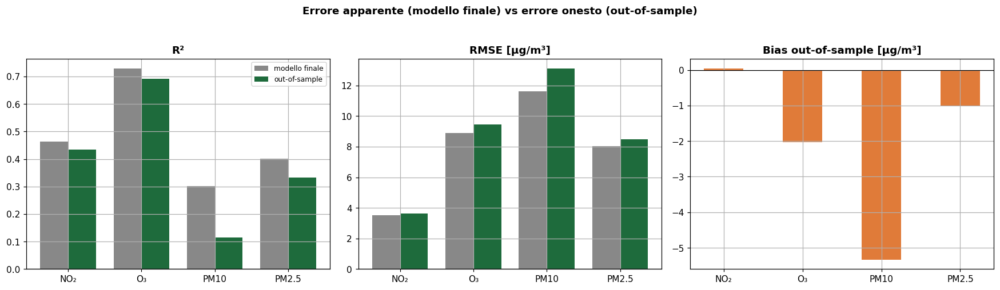

In [25]:
conf = []
for var in ORDINE:
    a = met_glob[(met_glob['Inquinante'] == var) &
                 (met_glob['previsione'] == 'modello finale, sulle sole righe OOS')].iloc[0]
    b = met_glob[(met_glob['Inquinante'] == var) &
                 (met_glob['previsione'] == 'out-of-sample (rolling-origin)')].iloc[0]
    conf.append({'Inquinante': var, 'n': int(b['n']),
                 'R² modello finale': round(a['R2'], 3), 'R² out-of-sample': round(b['R2'], 3),
                 'ΔR² (ottimismo)': round(a['R2'] - b['R2'], 3),
                 'RMSE modello finale': round(a['RMSE'], 2),
                 'RMSE out-of-sample': round(b['RMSE'], 2),
                 'ΔRMSE': round(b['RMSE'] - a['RMSE'], 2),
                 'Bias out-of-sample': round(b['Bias'], 3)})
tab_ott = pd.DataFrame(conf)
display(tab_ott)
tab_ott.to_csv(DIR_TABELLE / 'ottimismo_modello_finale.csv', sep=';', decimal=',', index=False)

fig, axes = plt.subplots(1, 3, figsize=(16, 4.4))
x = np.arange(len(ORDINE))
w = 0.38
for ax, (c1, c2, tit) in zip(axes, [('R² modello finale', 'R² out-of-sample', 'R²'),
                                    ('RMSE modello finale', 'RMSE out-of-sample', 'RMSE [µg/m³]'),
                                    (None, 'Bias out-of-sample', 'Bias out-of-sample [µg/m³]')]):
    if c1 is not None:
        ax.bar(x - w / 2, tab_ott[c1], w, label='modello finale', color=COLORI['riferimento'])
        ax.bar(x + w / 2, tab_ott[c2], w, label='out-of-sample', color=COLORI['target'])
    else:
        ax.bar(x, tab_ott[c2], 0.5, color=COLORI['oos'])
    ax.set_xticks(x)
    ax.set_xticklabels([NOMI[v] for v in ORDINE])
    ax.axhline(0, color='black', lw=0.8)
    ax.set_title(tit, fontweight='bold')
axes[0].legend(fontsize=8)
fig.suptitle('Errore apparente (modello finale) vs errore onesto (out-of-sample)',
             fontweight='bold', y=1.04)
plt.tight_layout()
plt.savefig(OUT_DIR / 'errore_finale_vs_oos.png', dpi=150, bbox_inches='tight')
plt.show()

### 8.2 Distribuzione dei residui

Media, mediana e percentili insieme: una distribuzione **asimmetrica** con mediana vicina a zero e
media positiva indica che il bias complessivo è prodotto da una **coda** di forti sottostime
(tipicamente gli episodi di picco), non da uno scarto diffuso su tutti i pixel. È una distinzione
operativa: nel primo caso il modello è utilizzabile in condizioni ordinarie e cede sui picchi.

,Inquinante,previsione,n,media,mediana,dev. std,asimmetria,curtosi,p1,p5,p10,p25,p50,p75,p90,p95,p99
0,NO2,modello finale,411899,0.0000,-0.4710,3.6290,1.1930,5.2290,-8.5040,-4.8730,-3.4510,-1.8390,-0.4710,1.2920,4.1570,6.6050,12.4960
1,NO2,out-of-sample,249112,0.0470,-0.6940,3.6230,1.6560,5.9150,-7.2630,-4.1860,-3.2260,-1.9170,-0.6940,1.2260,4.4190,6.9930,13.1220
2,O3,modello finale,420607,-0.0000,-0.2010,8.4660,0.2320,0.6230,-18.8860,-13.3120,-10.4680,-5.6830,-0.2010,5.3730,10.5850,14.0350,21.9510
3,O3,out-of-sample,249112,-2.0260,-2.5590,9.2390,0.4770,0.8630,-21.2870,-15.8070,-13.1370,-8.3900,-2.5590,3.5440,9.5940,13.8370,23.9430
4,PM10,modello finale,429180,0.0000,-2.2930,13.0910,1.6660,5.5580,-21.1320,-16.1310,-13.3990,-8.5510,-2.2930,5.7790,15.8590,23.6510,45.0520
5,PM10,out-of-sample,259996,-5.3280,-7.8610,11.9720,1.1580,2.0490,-25.1240,-20.3820,-17.8740,-13.5110,-7.8610,0.5690,10.9520,17.9870,32.1660
6,PM25,modello finale,411899,0.0000,-1.6110,9.2280,1.8050,7.7710,-18.5180,-11.4870,-8.3390,-4.9640,-1.6110,3.1580,10.6350,16.7150,32.6680
7,PM25,out-of-sample,249112,-1.0120,-3.0830,8.4440,1.3040,2.6540,-16.4710,-10.9180,-8.8510,-6.3330,-3.0830,2.4340,10.5020,16.1430,26.8090


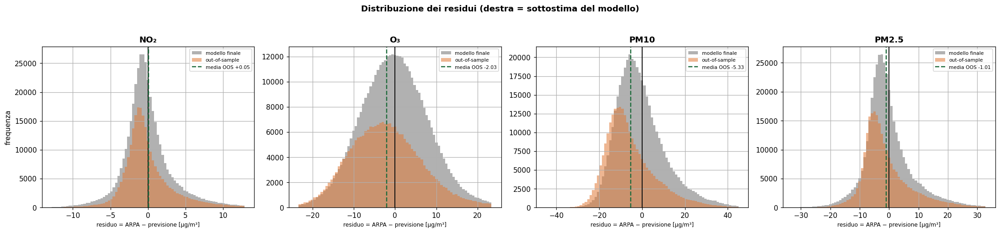

In [26]:
perc = [1, 5, 10, 25, 50, 75, 90, 95, 99]
righe = []
for var in ORDINE:
    for etichetta, col in [('modello finale', 'residuo'), ('out-of-sample', 'residuo_oos')]:
        r = PREV[var][col].dropna()
        if len(r) == 0:
            continue
        righe.append({'Inquinante': var, 'previsione': etichetta, 'n': len(r),
                      'media': r.mean(), 'mediana': r.median(), 'dev. std': r.std(),
                      'asimmetria': r.skew(), 'curtosi': r.kurt(),
                      **{f'p{q}': np.percentile(r, q) for q in perc}})
dist = pd.DataFrame(righe)
display(dist.round(3))
dist.to_csv(DIR_TABELLE / 'distribuzione_residui.csv', sep=';', decimal=',', index=False)

fig, axes = plt.subplots(1, 4, figsize=(20, 4.4))
for ax, var in zip(axes, ORDINE):
    r_fin = PREV[var]['residuo'].dropna()
    r_oos = PREV[var]['residuo_oos'].dropna()
    lim = float(np.percentile(np.abs(r_fin), 99))
    bins = np.linspace(-lim, lim, 80)
    ax.hist(r_fin, bins=bins, color=COLORI['riferimento'], alpha=0.65, label='modello finale')
    ax.hist(r_oos, bins=bins, color=COLORI['oos'], alpha=0.55, label='out-of-sample')
    ax.axvline(0, color='black', lw=1.2)
    ax.axvline(r_oos.mean(), color=COLORI['target'], lw=1.6, ls='--',
               label=f'media OOS {r_oos.mean():+.2f}')
    ax.set_title(f'{NOMI[var]}', fontweight='bold')
    ax.set_xlabel('residuo = ARPA − previsione [µg/m³]', fontsize=8)
    ax.legend(fontsize=7)
axes[0].set_ylabel('frequenza')
fig.suptitle('Distribuzione dei residui (destra = sottostima del modello)',
             fontweight='bold', y=1.04)
plt.tight_layout()
plt.savefig(OUT_DIR / 'distribuzione_residui.png', dpi=150, bbox_inches='tight')
plt.show()

### 8.3 L'errore dipende dal livello osservato

Residuo medio per **decile del valore ARPA osservato**. Un modello di regressione lineare tende
alla media: sottostima i valori alti e sovrastima i bassi (*regressione verso la media*). Se la
curva è monotòna crescente, questo è esattamente ciò che si osserva — ed è la ragione per cui il
bias medio complessivo può essere piccolo mentre l'errore sui picchi è grande.

> Il decile è calcolato sull'**osservato**, non sul previsto: condizionare sul previsto darebbe
> una curva diversa e non risponderebbe alla domanda "quanto sbaglio quando la concentrazione
> reale è alta".

,decile,n,arpa_medio,previsione_media,bias,mae,Inquinante
0,1,24912,0.0600,2.2600,-2.2000,2.2900,NO2
1,2,24911,0.2600,1.9800,-1.7200,1.8600,NO2
2,3,24911,0.7000,2.7100,-2.0100,2.0800,NO2
3,4,24911,1.4300,3.3400,-1.9100,1.9800,NO2
4,5,24911,2.3200,3.7600,-1.4400,1.5500,NO2
5,6,24911,3.2300,4.0200,-0.7900,1.1000,NO2
6,7,24911,4.3700,4.3900,-0.0100,1.3300,NO2
7,8,24911,6.0600,5.1800,0.8800,2.2100,NO2
8,9,24911,8.8800,6.5800,2.3000,3.0500,NO2
9,10,24912,15.5600,8.2000,7.3600,7.3900,NO2


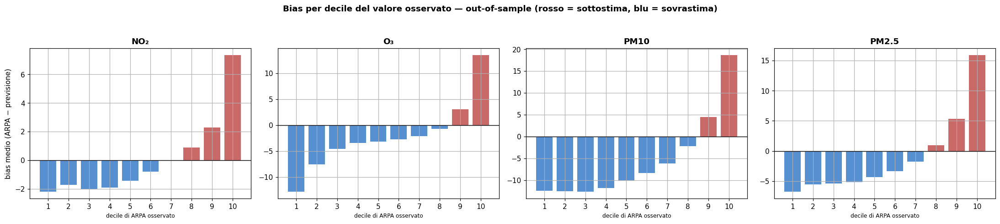

In [27]:
righe = []
for var in ORDINE:
    d = PREV[var].dropna(subset=['residuo_oos'])
    if len(d) == 0:
        continue
    dec = pd.qcut(d['arpa'], 10, labels=False, duplicates='drop')
    g = d.assign(decile=dec + 1).groupby('decile')
    t = g.agg(n=('residuo_oos', 'size'), arpa_medio=('arpa', 'mean'),
              previsione_media=('previsione_oos', 'mean'), bias=('residuo_oos', 'mean'),
              mae=('residuo_oos', lambda s: s.abs().mean()))
    t['Inquinante'] = var
    righe.append(t.reset_index())
dec_df = pd.concat(righe, ignore_index=True)
display(dec_df.round(2))
dec_df.to_csv(DIR_TABELLE / 'errore_per_decile.csv', sep=';', decimal=',', index=False)

fig, axes = plt.subplots(1, 4, figsize=(20, 4.2))
for ax, var in zip(axes, ORDINE):
    t = dec_df[dec_df['Inquinante'] == var]
    ax.bar(t['decile'], t['bias'], color=np.where(t['bias'] > 0, '#C0504D', '#3A7DC9'), alpha=0.85)
    ax.axhline(0, color='black', lw=0.9)
    ax.set_xticks(range(1, 11))
    ax.set_xlabel('decile di ARPA osservato', fontsize=8)
    ax.set_title(f'{NOMI[var]}', fontweight='bold')
axes[0].set_ylabel('bias medio (ARPA − previsione)')
fig.suptitle('Bias per decile del valore osservato — out-of-sample '
             '(rosso = sottostima, blu = sovrastima)', fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig(OUT_DIR / 'bias_per_decile.png', dpi=150, bbox_inches='tight')
plt.show()

## 9. Sintesi temporale degli errori

Come si distribuisce l'errore **nel tempo**: giorno per giorno, mese per mese, stagione per
stagione. Serve a distinguere un errore **casuale** (bias che oscilla attorno a zero) da una
**deriva sistematica** (bias di segno costante in un periodo), che indica un regime non catturato
dai predittori.

Le serie sono calcolate sulle previsioni **out-of-sample** dove disponibili; i giorni precedenti
al primo blocco di test sono mostrati con il modello finale e distinti graficamente, perché non
sono confrontabili con i primi.

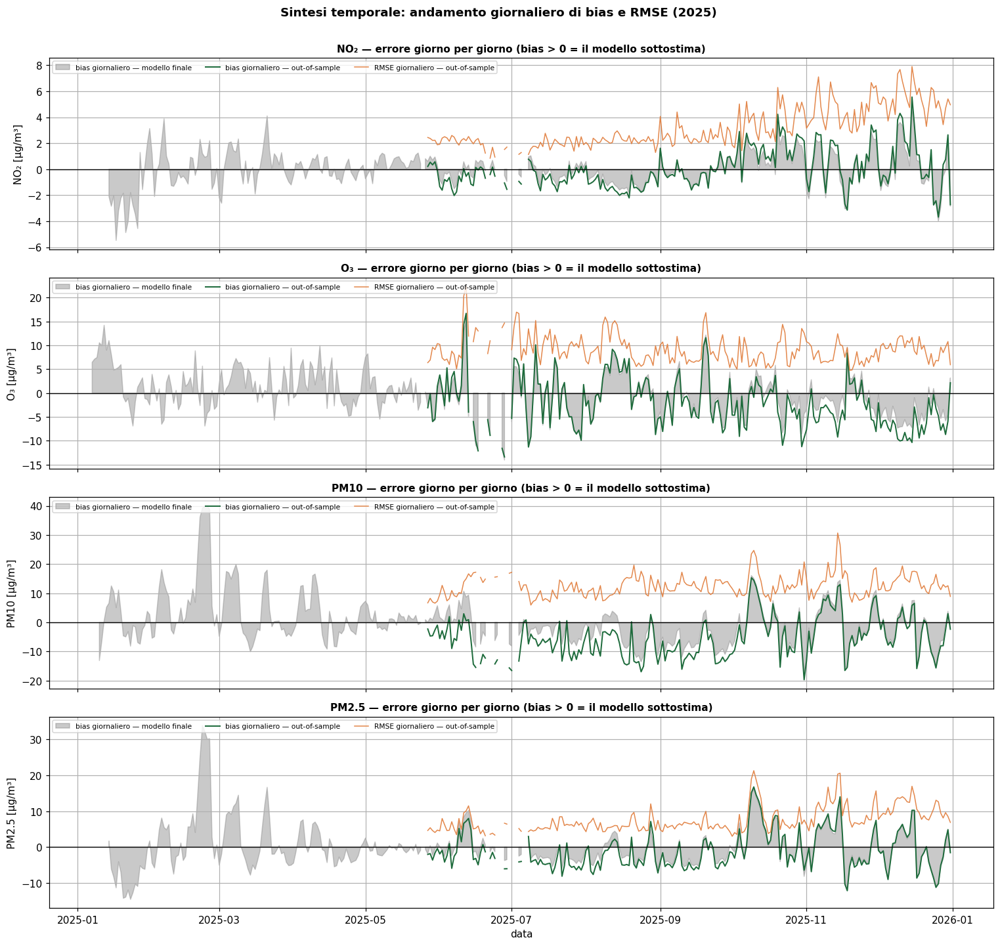

In [28]:
def metriche_per_gruppo(d, chiave, col_prev):
    x = d.dropna(subset=[col_prev, 'arpa']).copy()
    x['res'] = x['arpa'] - x[col_prev]
    x['abs'] = x['res'].abs()
    x['quad'] = x['res'] ** 2
    g = x.groupby(chiave)
    t = g.agg(n=('res', 'size'), arpa=('arpa', 'mean'), previsione=(col_prev, 'mean'),
              bias=('res', 'mean'), mae=('abs', 'mean'), mse=('quad', 'mean'))
    t['rmse'] = np.sqrt(t['mse'])
    t['nmb [%]'] = 100 * t['bias'] / t['arpa']
    return t.drop(columns='mse')


ERR_GIORNO = {}
for var in ORDINE:
    d = PREV[var]
    fin = metriche_per_gruppo(d, 'data', 'previsione').add_suffix('_fin')
    oos = metriche_per_gruppo(d, 'data', 'previsione_oos').add_suffix('_oos')
    ERR_GIORNO[var] = fin.join(oos, how='outer').reindex(CALENDARIO)
    ERR_GIORNO[var].index.name = 'data'

fig, axes = plt.subplots(4, 1, figsize=(14, 13), sharex=True)
for ax, var in zip(axes, ORDINE):
    t = ERR_GIORNO[var]
    ax.fill_between(t.index, 0, t['bias_fin'], color=COLORI['riferimento'], alpha=0.45,
                    label='bias giornaliero — modello finale')
    ax.plot(t.index, t['bias_oos'], color=COLORI['target'], lw=1.3,
            label='bias giornaliero — out-of-sample')
    ax.plot(t.index, t['rmse_oos'], color=COLORI['oos'], lw=1.0, alpha=0.9,
            label='RMSE giornaliero — out-of-sample')
    ax.axhline(0, color='black', lw=0.9)
    ax.set_ylabel(f'{NOMI[var]} [µg/m³]')
    ax.set_title(f'{NOMI[var]} — errore giorno per giorno '
                 f'(bias > 0 = il modello sottostima)', fontsize=10, fontweight='bold')
    ax.legend(fontsize=7, ncol=3, loc='upper left')
axes[-1].set_xlabel('data')
fig.suptitle('Sintesi temporale: andamento giornaliero di bias e RMSE (2025)',
             fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig(OUT_DIR / 'errore_giornaliero.png', dpi=150, bbox_inches='tight')
plt.show()

pd.concat({v: ERR_GIORNO[v] for v in ORDINE}, axis=1).round(4).to_csv(
    DIR_TABELLE / 'errore_giornaliero.csv', sep=';', decimal=',')

In [29]:
# ── Aggregazione mensile ─────────────────────────────────────────────────────
righe = []
for var in ORDINE:
    d = PREV[var].copy()
    d['mese'] = d['data'].dt.month
    t = metriche_per_gruppo(d, 'mese', 'previsione_oos')
    t_fin = metriche_per_gruppo(d, 'mese', 'previsione')
    for m in t_fin.index:
        riga = {'Inquinante': var, 'mese': MESI_IT[m - 1],
                'n (finale)': int(t_fin.loc[m, 'n']),
                'ARPA medio': round(t_fin.loc[m, 'arpa'], 2),
                'previsione media (finale)': round(t_fin.loc[m, 'previsione'], 2),
                'bias (finale)': round(t_fin.loc[m, 'bias'], 2),
                'MAE (finale)': round(t_fin.loc[m, 'mae'], 2),
                'RMSE (finale)': round(t_fin.loc[m, 'rmse'], 2)}
        if m in t.index:
            riga.update({'n (OOS)': int(t.loc[m, 'n']),
                         'bias (OOS)': round(t.loc[m, 'bias'], 2),
                         'MAE (OOS)': round(t.loc[m, 'mae'], 2),
                         'RMSE (OOS)': round(t.loc[m, 'rmse'], 2),
                         'NMB (OOS) [%]': round(t.loc[m, 'nmb [%]'], 1)})
        righe.append(riga)
err_mese = pd.DataFrame(righe)
display(err_mese)
err_mese.to_csv(DIR_TABELLE / 'errore_mensile.csv', sep=';', decimal=',', index=False)

,Inquinante,mese,n (finale),ARPA medio,previsione media (finale),bias (finale),MAE (finale),RMSE (finale),n (OOS),bias (OOS),MAE (OOS),RMSE (OOS),NMB (OOS) [%]
0,NO2,gennaio,20971,8.5200,10.5100,-2.0000,4.8500,6.0800,NaN,NaN,NaN,NaN,NaN
1,NO2,febbraio,34832,7.1700,6.9400,0.2300,3.2100,4.4600,NaN,NaN,NaN,NaN,NaN
2,NO2,marzo,38564,4.9200,4.5400,0.3800,2.5200,3.5500,NaN,NaN,NaN,NaN,NaN
3,NO2,aprile,37320,3.2400,3.2300,0.0100,1.7600,2.4500,NaN,NaN,NaN,NaN,NaN
4,NO2,maggio,37320,2.6800,2.1900,0.4900,1.4800,2.2000,"6,220.0000",0.3100,1.5700,2.2300,10.9000
5,NO2,giugno,24622,2.5000,2.7300,-0.2200,1.5200,2.0800,"24,622.0000",-0.7500,1.7000,2.2000,-30.1000
6,NO2,luglio,27938,2.2200,2.4500,-0.2300,1.3800,1.9400,"27,938.0000",-0.6100,1.5300,2.0200,-27.5000
7,NO2,agosto,38564,1.8300,2.7800,-0.9600,1.6200,2.0700,"38,564.0000",-1.2300,1.8100,2.2200,-67.4000
8,NO2,settembre,37320,2.9800,3.1600,-0.1800,1.8700,2.6700,"37,320.0000",-0.2200,1.9000,2.6900,-7.3000
9,NO2,ottobre,38564,5.0200,3.7500,1.2600,2.4200,3.6300,"38,564.0000",1.6300,2.5400,3.8500,32.4000


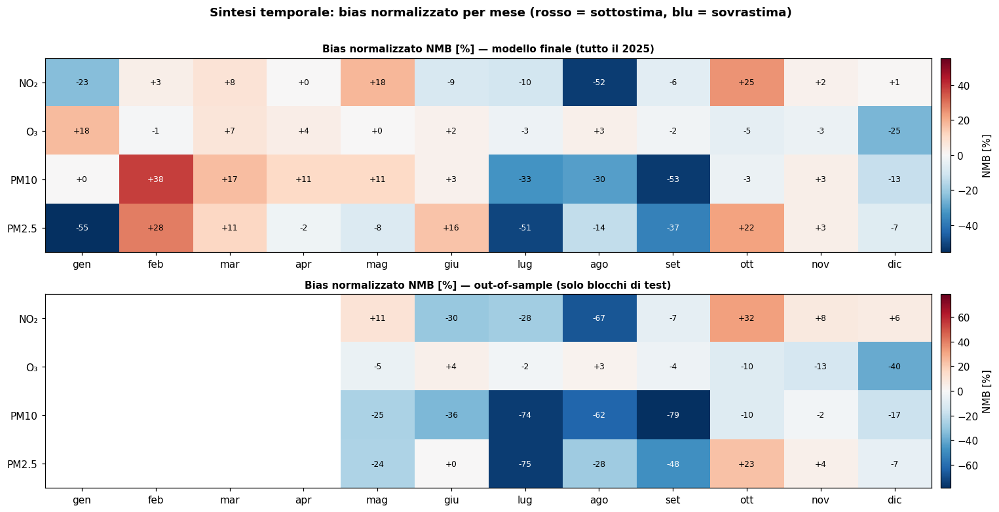

In [30]:
# ── Mappa di calore: bias normalizzato per mese e inquinante ─────────────────
piv = (err_mese.pivot(index='Inquinante', columns='mese', values='NMB (OOS) [%]')
               .reindex(index=ORDINE, columns=MESI_IT))
piv_fin = (err_mese.assign(nmb_fin=100 * err_mese['bias (finale)'] / err_mese['ARPA medio'])
                   .pivot(index='Inquinante', columns='mese', values='nmb_fin')
                   .reindex(index=ORDINE, columns=MESI_IT))

fig, axes = plt.subplots(2, 1, figsize=(14, 7))
for ax, dati_piv, tit in [(axes[0], piv_fin, 'modello finale (tutto il 2025)'),
                          (axes[1], piv, 'out-of-sample (solo blocchi di test)')]:
    lim = float(np.nanmax(np.abs(dati_piv.to_numpy())))
    im = ax.imshow(dati_piv.to_numpy(), cmap=CMAP_RES, vmin=-lim, vmax=lim, aspect='auto')
    ax.set_xticks(range(len(MESI_IT)))
    ax.set_xticklabels([m[:3] for m in MESI_IT])
    ax.set_yticks(range(len(ORDINE)))
    ax.set_yticklabels([NOMI[v] for v in ORDINE])
    for i in range(dati_piv.shape[0]):
        for j in range(dati_piv.shape[1]):
            v = dati_piv.to_numpy()[i, j]
            if np.isfinite(v):
                ax.text(j, i, f'{v:+.0f}', ha='center', va='center', fontsize=8,
                        color='black' if abs(v) < 0.6 * lim else 'white')
    ax.set_title(f'Bias normalizzato NMB [%] — {tit}', fontsize=10, fontweight='bold')
    ax.grid(False)
    plt.colorbar(im, ax=ax, fraction=0.02, pad=0.01, label='NMB [%]')
fig.suptitle('Sintesi temporale: bias normalizzato per mese '
             '(rosso = sottostima, blu = sovrastima)', fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig(OUT_DIR / 'bias_mensile_heatmap.png', dpi=150, bbox_inches='tight')
plt.show()

,Inquinante,stagione,previsione,n,ARPA medio,bias,MAE,RMSE,NMB [%]
0,NO2,DJF (inverno),modello finale,94367,7.7600,-0.3400,3.9500,5.2400,-4.4000
1,NO2,MAM (primavera),modello finale,113204,3.6300,0.2900,1.9300,2.8100,8.1000
2,NO2,JJA (estate),modello finale,91124,2.1300,-0.5400,1.5200,2.0300,-25.2000
3,NO2,SON (autunno),modello finale,113204,4.8800,0.4200,2.5400,3.7100,8.6000
4,NO2,DJF (inverno),out-of-sample,38564,7.8800,0.4900,4.1700,5.4900,6.2000
5,NO2,MAM (primavera),out-of-sample,6220,2.8500,0.3100,1.5700,2.2300,10.9000
6,NO2,JJA (estate),out-of-sample,91124,2.1300,-0.9100,1.7000,2.1600,-42.8000
7,NO2,SON (autunno),out-of-sample,113204,4.8800,0.6500,2.6000,3.8200,13.4000
8,O3,DJF (inverno),modello finale,103075,19.4700,-0.5700,6.7100,8.2400,-2.9000
9,O3,MAM (primavera),modello finale,113204,42.4100,1.3200,5.8300,7.4700,3.1000


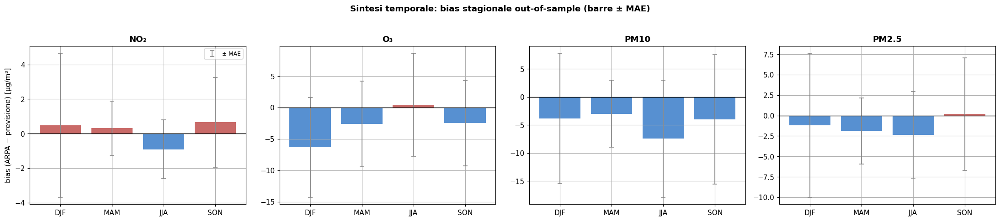

In [31]:
# ── Aggregazione stagionale ──────────────────────────────────────────────────
STAGIONE = {12: 'DJF (inverno)', 1: 'DJF (inverno)', 2: 'DJF (inverno)',
            3: 'MAM (primavera)', 4: 'MAM (primavera)', 5: 'MAM (primavera)',
            6: 'JJA (estate)', 7: 'JJA (estate)', 8: 'JJA (estate)',
            9: 'SON (autunno)', 10: 'SON (autunno)', 11: 'SON (autunno)'}
ORDINE_STAG = ['DJF (inverno)', 'MAM (primavera)', 'JJA (estate)', 'SON (autunno)']

righe = []
for var in ORDINE:
    d = PREV[var].copy()
    d['stagione'] = d['data'].dt.month.map(STAGIONE)
    for etichetta, col in [('modello finale', 'previsione'), ('out-of-sample', 'previsione_oos')]:
        t = metriche_per_gruppo(d, 'stagione', col)
        for s in ORDINE_STAG:
            if s in t.index:
                righe.append({'Inquinante': var, 'stagione': s, 'previsione': etichetta,
                              'n': int(t.loc[s, 'n']), 'ARPA medio': round(t.loc[s, 'arpa'], 2),
                              'bias': round(t.loc[s, 'bias'], 2), 'MAE': round(t.loc[s, 'mae'], 2),
                              'RMSE': round(t.loc[s, 'rmse'], 2),
                              'NMB [%]': round(t.loc[s, 'nmb [%]'], 1)})
err_stag = pd.DataFrame(righe)
display(err_stag)
err_stag.to_csv(DIR_TABELLE / 'errore_stagionale.csv', sep=';', decimal=',', index=False)

fig, axes = plt.subplots(1, 4, figsize=(20, 4.2), sharex=True)
sub = err_stag[err_stag['previsione'] == 'out-of-sample']
for ax, var in zip(axes, ORDINE):
    t = sub[sub['Inquinante'] == var].set_index('stagione').reindex(ORDINE_STAG)
    ax.bar(range(len(t)), t['bias'], color=np.where(t['bias'] > 0, '#C0504D', '#3A7DC9'),
           alpha=0.85)
    ax.errorbar(range(len(t)), t['bias'], yerr=t['MAE'], fmt='none', ecolor='grey',
                capsize=3, lw=1, label='± MAE')
    ax.axhline(0, color='black', lw=0.9)
    ax.set_xticks(range(len(t)))
    ax.set_xticklabels([s.split()[0] for s in ORDINE_STAG])
    ax.set_title(NOMI[var], fontweight='bold')
axes[0].set_ylabel('bias (ARPA − previsione) [µg/m³]')
axes[0].legend(fontsize=8)
fig.suptitle('Sintesi temporale: bias stagionale out-of-sample (barre ± MAE)',
             fontweight='bold', y=1.04)
plt.tight_layout()
plt.savefig(OUT_DIR / 'bias_stagionale.png', dpi=150, bbox_inches='tight')
plt.show()

## 10. Sintesi spaziale degli errori

Le stesse metriche calcolate **pixel per pixel** sull'intero anno: dove il modello funziona e dove
no. Le mappe sono alla risoluzione nativa S5P, come le mappe di valore.

- **bias per pixel** — errore sistematico di quel punto: un pattern spaziale coerente (per esempio
  bias positivo sulle aree urbane) indica che manca un predittore che descriva quella
  caratteristica, non un errore casuale;
- **MAE e RMSE per pixel** — ampiezza tipica dell'errore;
- **correlazione temporale per pixel** — capacità di seguire la *dinamica* di quel punto nel
  tempo, indipendentemente dal livello. Un pixel con correlazione alta e bias grande ha bisogno
  di una correzione di livello, non di un modello diverso;
- **numerosità per pixel** — i pixel con pochi giorni validi hanno metriche instabili e vanno letti
  con cautela.

In [32]:
def metriche_per_punto(var, col_prev):
    d = PREV[var][['punto_id', 'arpa', col_prev]].dropna()
    d = d.rename(columns={col_prev: 'prev'})
    d['res'] = d['arpa'] - d['prev']
    d['abs'] = d['res'].abs()
    d['quad'] = d['res'] ** 2
    d['prod'] = d['arpa'] * d['prev']
    d['arpa2'] = d['arpa'] ** 2
    d['prev2'] = d['prev'] ** 2
    g = d.groupby('punto_id')
    t = g.agg(n=('res', 'size'), arpa=('arpa', 'mean'), prev=('prev', 'mean'),
              bias=('res', 'mean'), mae=('abs', 'mean'), mse=('quad', 'mean'),
              ss_res=('quad', 'sum'), prod=('prod', 'mean'),
              arpa2=('arpa2', 'mean'), prev2=('prev2', 'mean'),
              var_arpa=('arpa', 'var'))
    t['rmse'] = np.sqrt(t['mse'])
    cov = t['prod'] - t['arpa'] * t['prev']
    sd = np.sqrt((t['arpa2'] - t['arpa'] ** 2).clip(lower=0) *
                 (t['prev2'] - t['prev'] ** 2).clip(lower=0))
    t['corr'] = (cov / sd.replace(0, np.nan))
    ss_tot = t['var_arpa'] * (t['n'] - 1)
    t['r2'] = 1 - t['ss_res'] / ss_tot.replace(0, np.nan)
    t['nmb'] = 100 * t['bias'] / t['arpa'].replace(0, np.nan)
    return t.reindex(PUNTI)[['n', 'arpa', 'prev', 'bias', 'mae', 'rmse', 'corr', 'r2', 'nmb']]


MET_PUNTO = {var: metriche_per_punto(var, 'previsione_oos') for var in ORDINE}
MET_PUNTO_FIN = {var: metriche_per_punto(var, 'previsione') for var in ORDINE}

for var in ORDINE:
    t = MET_PUNTO[var].join(COORD)
    t.insert(0, 'Inquinante', var)
    t.round(4).to_csv(DIR_TABELLE / f'metriche_per_punto_{var}.csv', sep=';', decimal=',')

riass = pd.DataFrame({
    var: {'pixel con metriche': int(MET_PUNTO[var]['n'].notna().sum()),
          'giorni per pixel (mediana)': float(MET_PUNTO[var]['n'].median()),
          'bias mediano': float(MET_PUNTO[var]['bias'].median()),
          'bias: 5°–95° percentile': f"{MET_PUNTO[var]['bias'].quantile(0.05):.2f} … "
                                     f"{MET_PUNTO[var]['bias'].quantile(0.95):.2f}",
          'MAE mediano': float(MET_PUNTO[var]['mae'].median()),
          'correlazione mediana': float(MET_PUNTO[var]['corr'].median()),
          'pixel con bias > 0 [%]': float(100 * (MET_PUNTO[var]['bias'] > 0).mean())}
    for var in ORDINE}).T
display(riass.round(3))
riass.to_csv(DIR_TABELLE / 'sintesi_spaziale.csv', sep=';', decimal=',')

,pixel con metriche,giorni per pixel (mediana),bias mediano,bias: 5°–95° percentile,MAE mediano,correlazione mediana,pixel con bias > 0 [%]
NO2,1244,201.0000,-0.0825,-2.32 … 3.74,2.3570,0.5515,46.6238
O3,1244,201.0000,-2.0596,-6.15 … 1.88,7.8648,0.8883,18.3280
PM10,1244,209.0000,-4.1304,-15.14 … 3.17,10.3152,0.3436,18.8103
PM25,1244,201.0000,-0.8843,-6.21 … 4.97,6.7372,0.4380,41.3183


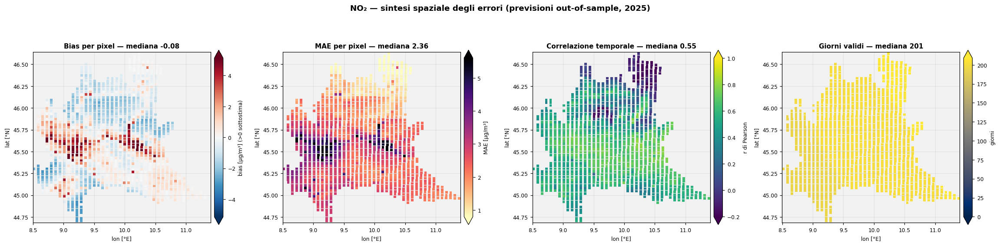

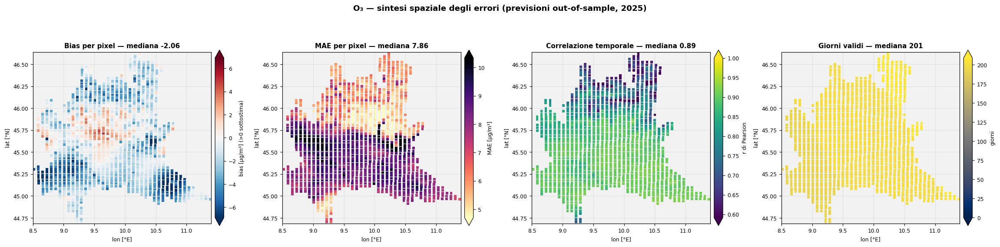

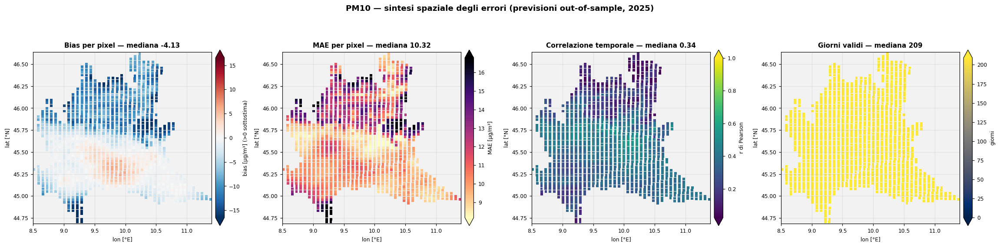

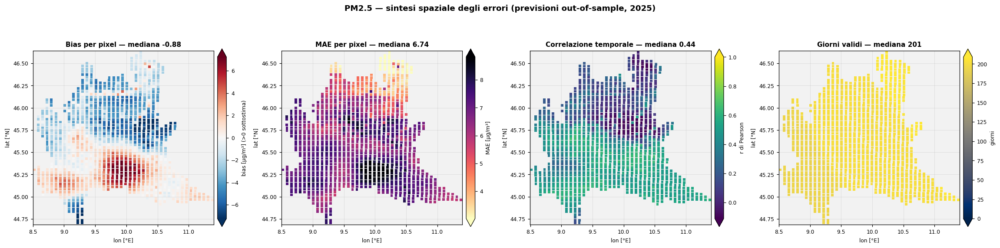

In [33]:
# ── Mappe delle metriche per pixel (out-of-sample) ───────────────────────────
for var in ORDINE:
    t = MET_PUNTO[var]
    lim_bias = float(np.nanpercentile(np.abs(t['bias']), 98))
    fig, axes = plt.subplots(1, 4, figsize=(21, 5.0))
    pannello_mappa(axes[0], t['bias'].to_numpy(),
                   f"Bias per pixel — mediana {t['bias'].median():+.2f}",
                   CMAP_RES, -lim_bias, lim_bias, 'bias [µg/m³] (>0 sottostima)')
    pannello_mappa(axes[1], t['mae'].to_numpy(),
                   f"MAE per pixel — mediana {t['mae'].median():.2f}",
                   'magma_r', float(np.nanpercentile(t['mae'], 2)),
                   float(np.nanpercentile(t['mae'], 98)), 'MAE [µg/m³]')
    pannello_mappa(axes[2], t['corr'].to_numpy(),
                   f"Correlazione temporale — mediana {t['corr'].median():.2f}",
                   'viridis', float(np.nanpercentile(t['corr'], 2)), 1.0, 'r di Pearson')
    pannello_mappa(axes[3], t['n'].to_numpy(),
                   f"Giorni validi — mediana {t['n'].median():.0f}",
                   'cividis', 0, float(np.nanmax(t['n'])), 'giorni')
    fig.suptitle(f'{NOMI[var]} — sintesi spaziale degli errori (previsioni out-of-sample, 2025)',
                 fontweight='bold', y=1.03)
    plt.tight_layout()
    plt.savefig(DIR_MAPPE / f'errori_per_punto_{var}.png', dpi=150, bbox_inches='tight')
    plt.show()

### 10.1 Il bias spaziale segue il livello locale

Confronto diretto fra il **livello medio ARPA** di ciascun pixel e il **bias** dello stesso pixel.
Una relazione crescente significa che il modello sbaglia **di più dove l'inquinamento è più alto**,
cioè non riesce a riprodurre i gradienti spaziali (tipicamente urbano vs rurale): coerente con
predittori meteorologici su cella ERA5 di 0.25°, che nei punti vicini assumono lo stesso valore.

La retta è una regressione dei minimi quadrati sui punti, riportata come descrizione della
tendenza, non come modello di correzione.

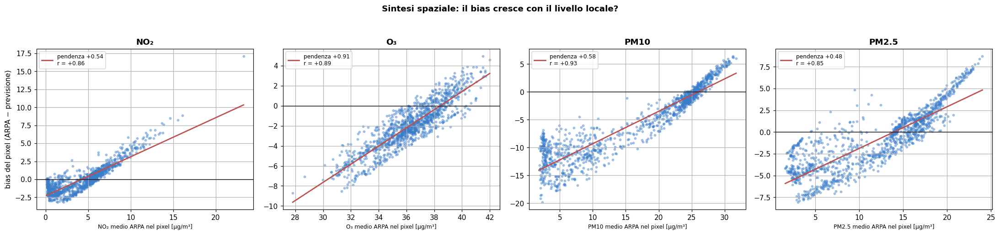

,Inquinante,pendenza bias vs livello,intercetta,r,n pixel
0,NO2,0.5432,-2.2920,0.8570,1244
1,O3,0.9058,-34.8190,0.8930,1244
2,PM10,0.5821,-15.1270,0.9320,1244
3,PM25,0.4785,-6.6590,0.8530,1244


In [34]:
fig, axes = plt.subplots(1, 4, figsize=(20, 4.4))
righe_pend = []
for ax, var in zip(axes, ORDINE):
    t = MET_PUNTO[var].dropna(subset=['bias', 'arpa'])
    ax.scatter(t['arpa'], t['bias'], s=8, alpha=0.4, color=COLORI['era5'], rasterized=True)
    if len(t) > 2:
        b, a = np.polyfit(t['arpa'], t['bias'], 1)
        xs = np.linspace(t['arpa'].min(), t['arpa'].max(), 50)
        ax.plot(xs, a + b * xs, color='#C0504D', lw=1.8,
                label=f'pendenza {b:+.2f}\nr = {np.corrcoef(t["arpa"], t["bias"])[0, 1]:+.2f}')
        righe_pend.append({'Inquinante': var, 'pendenza bias vs livello': round(b, 4),
                           'intercetta': round(a, 3),
                           'r': round(float(np.corrcoef(t['arpa'], t['bias'])[0, 1]), 3),
                           'n pixel': len(t)})
        ax.legend(fontsize=8)
    ax.axhline(0, color='black', lw=0.9)
    ax.set_xlabel(f'{NOMI[var]} medio ARPA nel pixel [µg/m³]', fontsize=8)
    ax.set_title(NOMI[var], fontweight='bold')
axes[0].set_ylabel('bias del pixel (ARPA − previsione)')
fig.suptitle('Sintesi spaziale: il bias cresce con il livello locale?',
             fontweight='bold', y=1.05)
plt.tight_layout()
plt.savefig(OUT_DIR / 'bias_vs_livello_spaziale.png', dpi=150, bbox_inches='tight')
plt.show()

tab_pend = pd.DataFrame(righe_pend)
display(tab_pend)
tab_pend.to_csv(DIR_TABELLE / 'bias_vs_livello_spaziale.csv', sep=';', decimal=',', index=False)

### 10.2 Pixel con l'errore maggiore

I dieci pixel con MAE più alto e i dieci con MAE più basso, con coordinate: servono a controllare
se l'errore si concentra in aree identificabili (fondovalle, aree urbane, bordi del dominio) e
sono il punto di partenza per un'indagine mirata.

In [35]:
righe = []
for var in ORDINE:
    t = MET_PUNTO[var].join(COORD).dropna(subset=['mae'])
    for etichetta, sub in [('peggiori (MAE alto)', t.nlargest(10, 'mae')),
                           ('migliori (MAE basso)', t.nsmallest(10, 'mae'))]:
        s = sub.reset_index()
        s.insert(0, 'gruppo', etichetta)
        s.insert(0, 'Inquinante', var)
        righe.append(s)
estremi = pd.concat(righe, ignore_index=True)[
    ['Inquinante', 'gruppo', 'punto_id', 'lon', 'lat', 'n', 'arpa', 'bias', 'mae', 'rmse', 'corr']]
display(estremi.round(3))
estremi.round(4).to_csv(DIR_TABELLE / 'pixel_estremi.csv', sep=';', decimal=',', index=False)

,Inquinante,gruppo,punto_id,lon,lat,n,arpa,bias,mae,rmse,corr
0,NO2,peggiori (MAE alto),565,8.7280,45.6500,194,23.2570,17.1310,17.1310,18.3760,0.3670
1,NO2,peggiori (MAE alto),654,9.2220,45.5560,201,16.0550,8.8840,8.9850,10.8670,0.6540
2,NO2,peggiori (MAE alto),593,8.7280,45.6190,194,14.6150,8.4910,8.5210,9.9530,0.6050
3,NO2,peggiori (MAE alto),681,9.1520,45.5240,198,15.5450,8.2690,8.3590,10.3720,0.6140
4,NO2,peggiori (MAE alto),788,9.1510,45.3980,194,13.8590,7.6250,7.9350,9.8920,0.3240
...,...,...,...,...,...,...,...,...,...,...,...
75,PM25,migliori (MAE basso),46,10.2990,46.3990,209,2.8440,-1.5680,2.8550,3.3290,0.0400
76,PM25,migliori (MAE basso),1,10.1600,46.5900,209,2.9760,-1.3510,2.8790,3.3620,0.0230
77,PM25,migliori (MAE basso),37,10.2990,46.4310,209,2.9960,-1.4040,2.8860,3.3920,0.0050
78,PM25,migliori (MAE basso),45,10.2270,46.4000,209,2.8630,-1.4940,2.9050,3.3820,0.0330


### 10.3 Quanto dell'errore è "giorno" e quanto è "punto"

Decomposizione additiva del residuo:

$$r(t,s) \;=\; \underbrace{\overline{r}}_{\text{bias globale}}
+ \underbrace{\big(\overline{r}_{t\cdot} - \overline{r}\big)}_{\text{componente del giorno}}
+ \underbrace{\big(\overline{r}_{\cdot s} - \overline{r}\big)}_{\text{componente del punto}}
+ \underbrace{\varepsilon(t,s)}_{\text{residuo dell'interazione}}$$

Le tre quote di somma dei quadrati dicono **dove intervenire**:

- quota **giorno** alta → l'errore è un problema di **condizioni giornaliere** (un regime
  meteorologico o un episodio non catturato): agiscono predittori temporali aggiuntivi;
- quota **punto** alta → l'errore è un problema di **eterogeneità spaziale**: agiscono covariate
  di località (uso del suolo, quota, prossimità a sorgenti);
- quota **interazione** alta → l'errore non è riducibile né con l'una né con l'altra da sole.

> **Caveat.** Con dati mancanti la decomposizione non è ortogonale, quindi le tre quote **non
> sommano esattamente a 100 %**. I valori vanno letti come ordini di grandezza relativi, non come
> una partizione esatta della varianza.

,Inquinante,bias globale,quota giorno [%],quota punto [%],quota interazione [%],somma [%]
0,NO2,0.0470,18.8000,26.8000,54.4000,100.0000
1,O3,-2.0260,32.2000,6.4000,61.5000,100.1000
2,PM10,-5.3280,33.6000,24.3000,42.1000,100.0000
3,PM25,-1.0120,40.1000,15.9000,44.0000,100.0000


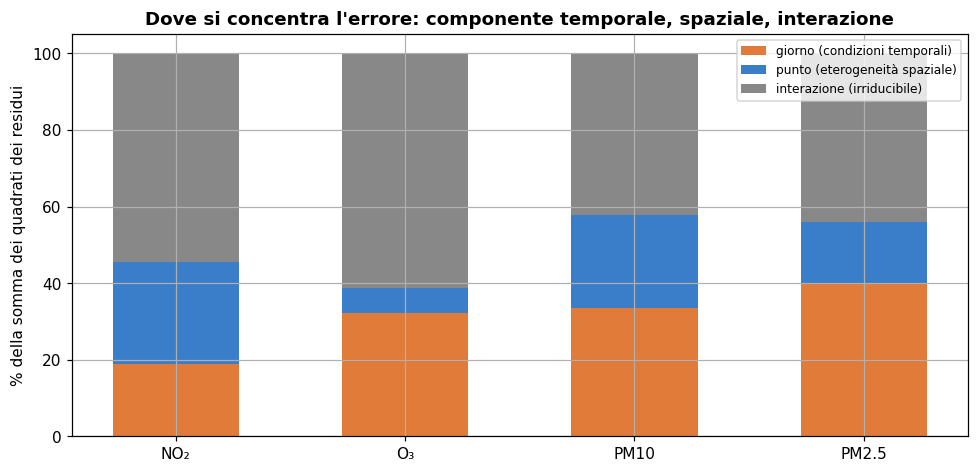

In [36]:
righe = []
for var in ORDINE:
    R = CUBO[var]['residuo_oos'].to_numpy()
    mask = np.isfinite(R)
    if mask.sum() == 0:
        continue
    m = float(np.nanmean(R))
    mg = np.nanmean(R, axis=1)                 # media per giorno
    mp = np.nanmean(R, axis=0)                 # media per punto
    MG = np.repeat(mg[:, None], R.shape[1], axis=1)
    MP = np.repeat(mp[None, :], R.shape[0], axis=0)

    ss_tot = float(np.nansum((R - m) ** 2))
    ss_giorno = float(np.nansum(np.where(mask, (MG - m) ** 2, 0.0)))
    ss_punto = float(np.nansum(np.where(mask, (MP - m) ** 2, 0.0)))
    ss_inter = float(np.nansum(np.where(mask, (R - MG - MP + m) ** 2, 0.0)))
    righe.append({'Inquinante': var, 'bias globale': round(m, 3),
                  'quota giorno [%]': round(100 * ss_giorno / ss_tot, 1),
                  'quota punto [%]': round(100 * ss_punto / ss_tot, 1),
                  'quota interazione [%]': round(100 * ss_inter / ss_tot, 1),
                  'somma [%]': round(100 * (ss_giorno + ss_punto + ss_inter) / ss_tot, 1)})
dec_var = pd.DataFrame(righe)
display(dec_var)
dec_var.to_csv(DIR_TABELLE / 'decomposizione_errore.csv', sep=';', decimal=',', index=False)

fig, ax = plt.subplots(figsize=(9, 4.4))
x = np.arange(len(dec_var))
b1 = dec_var['quota giorno [%]']
b2 = dec_var['quota punto [%]']
b3 = dec_var['quota interazione [%]']
ax.bar(x, b1, 0.55, label='giorno (condizioni temporali)', color=COLORI['oos'])
ax.bar(x, b2, 0.55, bottom=b1, label='punto (eterogeneità spaziale)', color=COLORI['era5'])
ax.bar(x, b3, 0.55, bottom=b1 + b2, label='interazione (irriducibile)',
       color=COLORI['riferimento'])
ax.set_xticks(x)
ax.set_xticklabels([NOMI[v] for v in dec_var['Inquinante']])
ax.set_ylabel('% della somma dei quadrati dei residui')
ax.set_title('Dove si concentra l\'errore: componente temporale, spaziale, interazione',
             fontweight='bold')
ax.legend(fontsize=8)
plt.tight_layout()
plt.savefig(OUT_DIR / 'decomposizione_errore.png', dpi=150, bbox_inches='tight')
plt.show()

## 11. Tabella finale e file prodotti

In [37]:
sintesi = []
for var in ORDINE:
    fin = met_glob[(met_glob['Inquinante'] == var) &
                   (met_glob['previsione'] == 'modello finale (tutto il 2025)')].iloc[0]
    oos = met_glob[(met_glob['Inquinante'] == var) &
                   (met_glob['previsione'] == 'out-of-sample (rolling-origin)')].iloc[0]
    cfg = CONFIG_S5P[var]
    sintesi.append({
        'Inquinante': NOMI[var],
        'Predittore S5P': f"{cfg['proxy']} (lag {cfg['lag']}, MA {cfg['ma']})",
        'Pixel S5P': len(PUNTI), 'Giorni': len(CALENDARIO),
        'Copertura previsione [%]': round(100 * PREV[var]['previsione'].notna().mean(), 1),
        'ARPA medio 2025': round(fin['media ARPA'], 2),
        'Previsione media 2025': round(fin['media previsione'], 2),
        'ARPA medio (campione OOS)': round(oos['media ARPA'], 2),
        'Previsione media (campione OOS)': round(oos['media previsione'], 2),
        'Bias OOS (ARPA − prev)': round(oos['Bias'], 3),
        'MAE OOS': round(oos['MAE'], 2), 'RMSE OOS': round(oos['RMSE'], 2),
        'R² OOS': round(oos['R2'], 3),
        'r Pearson OOS': round(oos['r Pearson'], 3),
        'NMB OOS [%]': round(oos['NMB [%]'], 1), 'NRMSE OOS [%]': round(oos['NRMSE [%]'], 1),
    })
tab_finale = pd.DataFrame(sintesi)
display(tab_finale)
tab_finale.to_csv(OUT_DIR / 'sintesi_finale.csv', sep=';', decimal=',', index=False)
print('Convenzione: residuo = ARPA − previsione (bias > 0 = il modello sottostima).')
print('Le due medie 2025 coincidono per costruzione (OLS con intercetta, § 8): il confronto')
print('informativo fra livello osservato e previsto è quello sul campione out-of-sample.')
print('Tutti gli errori riportati (Bias, MAE, RMSE, R², NMB, NRMSE) sono out-of-sample.')

Convenzione: residuo = ARPA − previsione (bias > 0 = il modello sottostima).
Le due medie 2025 coincidono per costruzione (OLS con intercetta, § 8): il confronto
informativo fra livello osservato e previsto è quello sul campione out-of-sample.
Tutti gli errori riportati (Bias, MAE, RMSE, R², NMB, NRMSE) sono out-of-sample.


,Inquinante,Predittore S5P,Pixel S5P,Giorni,Copertura previsione [%],ARPA medio 2025,Previsione media 2025,ARPA medio (campione OOS),Previsione media (campione OOS),Bias OOS (ARPA − prev),MAE OOS,RMSE OOS,R² OOS,r Pearson OOS,NMB OOS [%],NRMSE OOS [%]
0,NO₂,"NO2_TROPOMI (lag 7, MA 14)",1244,365,90.7000,4.5900,4.5900,4.2900,4.2400,0.0470,2.4900,3.6200,0.4350,0.6680,1.1000,84.5000
1,O₃,"NO2_proxy (lag 0, MA 14)",1244,365,92.6000,35.4200,35.4200,36.2100,38.2400,-2.0260,7.4900,9.4600,0.6910,0.8480,-5.6000,26.1000
2,PM10,"Aerosol_Index (lag 3, MA 14)",1244,365,94.5000,17.4300,17.4300,16.8300,22.1600,-5.3280,10.9700,13.1000,0.1140,0.5160,-31.7000,77.8000
3,PM2.5,"NO2_proxy (lag 7, MA 14)",1244,365,90.7000,12.5200,12.5200,11.7700,12.7800,-1.0120,6.5400,8.5000,0.3320,0.5840,-8.6000,72.3000


In [38]:
print('File prodotti in', OUT_DIR.resolve(), '\n')
totale = 0
for d in [OUT_DIR, DIR_TABELLE, DIR_MAPPE, DIR_MAPPE_GIORNALIERE, DIR_CUBI]:
    file = sorted(f for f in d.iterdir() if f.is_file())
    if not file:
        continue
    print(f'{d.relative_to(OUT_DIR.parent)}/  ({len(file)} file)')
    for f in file[:14]:
        print(f'   {f.name:52s} {f.stat().st_size / 1024:9,.0f} KB')
    if len(file) > 14:
        print(f'   ... e altri {len(file) - 14} file')
    totale += len(file)
    print()
print(f'Totale: {totale} file')

File prodotti in C:\Users\nsarmientoospina\Documents\REG4IA\risultati_previsione_2025 

risultati_previsione_2025/  (9 file)
   bias_mensile_heatmap.png                                   127 KB
   bias_per_decile.png                                         63 KB
   bias_stagionale.png                                         59 KB
   bias_vs_livello_spaziale.png                               351 KB
   decomposizione_errore.png                                   48 KB
   distribuzione_residui.png                                   94 KB
   errore_finale_vs_oos.png                                    55 KB
   errore_giornaliero.png                                     652 KB
   sintesi_finale.csv                                           1 KB

risultati_previsione_2025\tabelle/  (22 file)
   bias_vs_livello_spaziale.csv                                 0 KB
   copertura_giornaliera.csv                                   10 KB
   copertura_previsione.csv                                     0 KB


## 12. Come leggere questi risultati (e cosa non concludere)

**Il residuo è `ARPA − previsione`.** Rosso nelle mappe e barre positive = il modello **sottostima**
rispetto alla mappa ARPA. Il segno è opposto a quello di `modello_s5p_era5_arpa.ipynb`: il § 5.4 lo
verifica numericamente, quindi un confronto fra i due notebook va fatto ricordando il cambio di
segno del solo bias (R², RMSE e MAE non cambiano).

**Le mappe usano il modello finale, le statistiche citabili sono out-of-sample.** Produrre mappe
per l'intero anno richiede un modello disponibile ogni giorno, e il modello finale è la scelta
naturale; ma il suo errore, misurato sugli stessi giorni che ha visto in fase di stima, è
ottimistico. Il § 8.1 misura l'ottimismo: è quello lo scarto da tenere presente quando si
comunica l'accuratezza delle mappe.

**La copertura non è uniforme, e non è casuale.** I pixel-giorno mancanti sono quelli con
nuvolosità: il campione su cui l'errore è misurato è **sbilanciato verso condizioni di cielo
sereno**. Le statistiche descrivono quindi la performance in quelle condizioni, e sono
plausibilmente ottimistiche nelle situazioni di cielo coperto — che spesso coincidono con episodi
di accumulo invernale.

**Un bias spaziale strutturato non è rumore.** Se la mappa dei bias per pixel (§ 10) mostra un
pattern coerente e la pendenza bias-livello (§ 10.1) è positiva, il modello sta comprimendo i
gradienti spaziali: prevede un campo troppo piatto. È il comportamento atteso quando i predittori
principali (ERA5, cella 0.25°) sono più grossolani del target.

**Cosa non concludere**

1. **Il residuo non è l'errore rispetto alla misura strumentale.** Il riferimento è la mappa
   *assimilata* ARPA, che nei punti lontani dalle stazioni è essa stessa il prodotto di uno schema
   di interpolazione. Un residuo grande può indicare un errore del modello **o** un'incertezza
   della mappa di riferimento in quel punto: i due contributi non sono separabili con questi dati.
2. **Nessuna conclusione su nuove località.** La validazione separa i **giorni**, non i punti:
   tutti i pixel compaiono sia in stima sia in test. Le metriche descrivono la generalizzazione a
   giorni nuovi, non a un dominio diverso.
3. **Le medie mensili e annuali non sono climatologie.** Sono medie sui soli giorni con copertura,
   quindi non sono confrontabili con una media annuale calcolata su tutti i giorni.
4. **Le previsioni negative non sono valori fisici.** Sono conservate per non distorcere le
   statistiche (§ 5.3); qualsiasi uso operativo delle mappe deve decidere esplicitamente come
   trattarle, e dichiararlo.
5. **Lag e finestre sono ereditati** dal notebook temporale, dove erano stati selezionati
   sull'intero 2025 e contro il target CAMS: resta una quota di ottimismo dovuta alla selezione,
   non rimossa dalla validazione temporale.